# Deep Learning Lab Practical – 6
## Generative Models: VAE, GAN, CGAN, DCGAN
### Sardar Vallabhbhai National Institute of Technology, Surat – 395007
### Department of Artificial Intelligence | AI302

In [1]:
# ── Cell 1: Install & Imports ─────────────────────────────────────────────────
# Uncomment the line below on first run:
# !pip install torch torchvision matplotlib seaborn scikit-learn tqdm torchmetrics

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.utils as vutils

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score

import time, copy, os, warnings, math
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device : {device}')
print(f'PyTorch: {torch.__version__}')
print('✅ All imports successful!')

Device : cuda
PyTorch: 2.10.0+cu128
✅ All imports successful!


---
## Dataset Loading
Loading **FashionMNIST** and **EMNIST-Balanced** as specified in the assignment.

In [2]:
# ── Cell 2: Dataset Loading ───────────────────────────────────────────────────
# Images scaled to [-1, 1] for GAN Tanh output; VAE uses [0,1] (separate loader)
transform_gan = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))   # → [-1, 1]
])
transform_vae = transforms.Compose([
    transforms.ToTensor()                   # → [0, 1]
])

# ── FashionMNIST ──────────────────────────────────────────────────────────────
fmnist_train_gan = datasets.FashionMNIST('./data', train=True,  download=True, transform=transform_gan)
fmnist_test_gan  = datasets.FashionMNIST('./data', train=False, download=True, transform=transform_gan)
fmnist_train_vae = datasets.FashionMNIST('./data', train=True,  download=True, transform=transform_vae)
fmnist_test_vae  = datasets.FashionMNIST('./data', train=False, download=True, transform=transform_vae)

fmnist_loader_gan = DataLoader(fmnist_train_gan, batch_size=128, shuffle=True,  num_workers=0)
fmnist_loader_vae = DataLoader(fmnist_train_vae, batch_size=128, shuffle=True,  num_workers=0)
fmnist_test_loader= DataLoader(fmnist_test_gan,  batch_size=128, shuffle=False, num_workers=0)

FMNIST_CLASSES = ['T-shirt','Trouser','Pullover','Dress','Coat',
                   'Sandal','Shirt','Sneaker','Bag','Ankle boot']

print(f"FashionMNIST — Train: {len(fmnist_train_gan):,}  Test: {len(fmnist_test_gan):,}  Classes: 10")

# ── EMNIST-Balanced ───────────────────────────────────────────────────────────
emnist_train_gan = datasets.EMNIST('./data', split='balanced', train=True,  download=True, transform=transform_gan)
emnist_test_gan  = datasets.EMNIST('./data', split='balanced', train=False, download=True, transform=transform_gan)
emnist_train_vae = datasets.EMNIST('./data', split='balanced', train=True,  download=True, transform=transform_vae)

emnist_loader_gan = DataLoader(emnist_train_gan, batch_size=128, shuffle=True,  num_workers=0)
emnist_loader_vae = DataLoader(emnist_train_vae, batch_size=128, shuffle=True,  num_workers=0)
emnist_test_loader= DataLoader(emnist_test_gan,  batch_size=128, shuffle=False, num_workers=0)

NUM_CLASSES_FMNIST  = 10
NUM_CLASSES_EMNIST  = 47

print(f"EMNIST-Balanced — Train: {len(emnist_train_gan):,}  Test: {len(emnist_test_gan):,}  Classes: 47")

100%|██████████| 26.4M/26.4M [00:02<00:00, 9.41MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 174kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 2.84MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 19.8MB/s]


FashionMNIST — Train: 60,000  Test: 10,000  Classes: 10


100%|██████████| 562M/562M [00:04<00:00, 139MB/s]


EMNIST-Balanced — Train: 112,800  Test: 18,800  Classes: 47


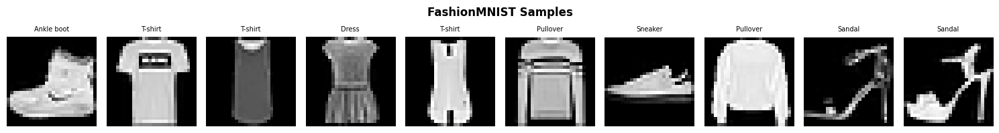

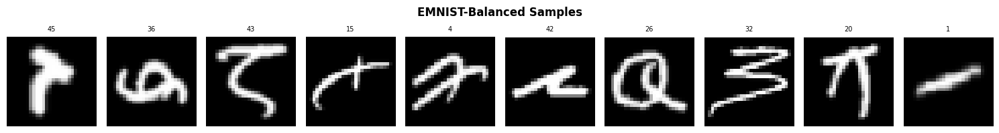

In [3]:
# ── Cell 3: Visualise samples ─────────────────────────────────────────────────
def show_dataset_samples(dataset, title, n=10, class_names=None):
    fig, axes = plt.subplots(1, n, figsize=(15, 2))
    fig.suptitle(title, fontsize=12, fontweight='bold')
    for i in range(n):
        img, lbl = dataset[i]
        axes[i].imshow(img.squeeze(), cmap='gray')
        axes[i].set_title(class_names[lbl] if class_names else str(lbl), fontsize=7)
        axes[i].axis('off')
    plt.tight_layout(); plt.show()

show_dataset_samples(fmnist_train_vae, 'FashionMNIST Samples', class_names=FMNIST_CLASSES)
show_dataset_samples(emnist_train_vae, 'EMNIST-Balanced Samples')

---
## Utility Functions (shared across all models)

In [4]:
# ── Cell 4: Utility Functions ─────────────────────────────────────────────────
def weights_init(m):
    """Radford et al. DCGAN weight initialisation: N(0, 0.02)."""
    classname = m.__class__.__name__
    if 'Conv' in classname or 'Linear' in classname:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    if hasattr(m, 'bias') and m.bias is not None:
        nn.init.constant_(m.bias.data, 0)
    if 'BatchNorm' in classname:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

def show_image_grid(images, title, nrow=8, figsize=(10, 4)):
    """Show a grid of images (tensor values assumed in [-1,1] or [0,1])."""
    if images.min() < 0:           # [-1,1] → [0,1]
        images = (images + 1) / 2
    grid = vutils.make_grid(images[:64].cpu(), nrow=nrow, normalize=False, padding=2)
    plt.figure(figsize=figsize)
    plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
    plt.title(title, fontsize=12, fontweight='bold')
    plt.axis('off'); plt.tight_layout(); plt.show()

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def plot_losses(G_losses, D_losses, title='GAN Training Losses'):
    plt.figure(figsize=(10, 4))
    plt.plot(G_losses, label='Generator Loss',     color='blue',   alpha=0.8)
    plt.plot(D_losses, label='Discriminator Loss', color='orange', alpha=0.8)
    plt.xlabel('Iteration'); plt.ylabel('Loss')
    plt.title(title, fontweight='bold'); plt.legend(); plt.grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()

print('Utility functions loaded.')

Utility functions loaded.


---
# Problem Statement 1: Variational Autoencoder (VAE)

In [5]:
# ── Cell 5: VAE Architecture ──────────────────────────────────────────────────
class VAEEncoder(nn.Module):
    def __init__(self, latent_dim=32):
        super().__init__()
        self.shared = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 512), nn.ReLU(),
            nn.Linear(512, 256), nn.ReLU(),
        )
        self.mu_head     = nn.Linear(256, latent_dim)
        self.logvar_head = nn.Linear(256, latent_dim)

    def forward(self, x):
        h   = self.shared(x)
        mu  = self.mu_head(h)
        logvar = self.logvar_head(h)
        return mu, logvar


class VAEDecoder(nn.Module):
    def __init__(self, latent_dim=32):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(latent_dim, 256), nn.ReLU(),
            nn.Linear(256, 512),        nn.ReLU(),
            nn.Linear(512, 784),        nn.Sigmoid()   # pixel values in [0,1]
        )

    def forward(self, z):
        return self.net(z).view(-1, 1, 28, 28)


class VAE(nn.Module):
    def __init__(self, latent_dim=32):
        super().__init__()
        self.encoder = VAEEncoder(latent_dim)
        self.decoder = VAEDecoder(latent_dim)
        self.latent_dim = latent_dim

    def reparameterise(self, mu, logvar):
        """z = mu + eps * exp(0.5 * logvar),  eps ~ N(0,I)"""
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z          = self.reparameterise(mu, logvar)
        recon      = self.decoder(z)
        return recon, mu, logvar

    @torch.no_grad()
    def sample(self, n, device):
        z = torch.randn(n, self.latent_dim, device=device)
        return self.decoder(z)


def vae_loss(recon, x, mu, logvar, kl_weight=1.0):
    """
    ELBO = Reconstruction Loss (BCE) + KL Weight * KL Divergence
    KL = -0.5 * sum(1 + logvar - mu^2 - exp(logvar))
    """
    recon_loss = F.binary_cross_entropy(recon, x, reduction='sum') / x.size(0)
    kl_loss    = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kl_weight * kl_loss, recon_loss.item(), kl_loss.item()


print(f'VAE (latent=32) params: {count_parameters(VAE(32)):,}')

VAE (latent=32) params: 1,091,920


In [6]:
# ── Cell 6: VAE Training Function ─────────────────────────────────────────────
def train_vae(loader, latent_dim=32, epochs=20, lr=1e-3, kl_warmup=10):
    model = VAE(latent_dim).to(device)
    opt   = optim.Adam(model.parameters(), lr=lr)
    history = {'total': [], 'recon': [], 'kl': []}

    for epoch in range(epochs):
        # KL annealing: linearly warm up over first kl_warmup epochs
        kl_weight = min(1.0, (epoch + 1) / kl_warmup)
        model.train()
        tot_loss = tot_recon = tot_kl = 0

        for imgs, _ in loader:
            imgs = imgs.to(device)
            opt.zero_grad()
            recon, mu, logvar = model(imgs)
            loss, r, k = vae_loss(recon, imgs, mu, logvar, kl_weight)
            loss.backward()
            opt.step()
            tot_loss  += loss.item()
            tot_recon += r
            tot_kl    += k

        n = len(loader)
        history['total'].append(tot_loss / n)
        history['recon'].append(tot_recon / n)
        history['kl'].append(tot_kl / n)

        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"Epoch [{epoch+1:>2}/{epochs}]  "
                  f"Total: {history['total'][-1]:.2f}  "
                  f"Recon: {history['recon'][-1]:.2f}  "
                  f"KL: {history['kl'][-1]:.4f}  "
                  f"KL-w: {kl_weight:.2f}")

    return model, history


# Train on FashionMNIST
print('Training VAE on FashionMNIST...')
vae_fmnist, vae_fmnist_hist = train_vae(fmnist_loader_vae, latent_dim=32, epochs=20)

# Train on EMNIST
print('\nTraining VAE on EMNIST-Balanced...')
vae_emnist, vae_emnist_hist = train_vae(emnist_loader_vae, latent_dim=32, epochs=20)

Training VAE on FashionMNIST...
Epoch [ 1/20]  Total: 267.48  Recon: 267.01  KL: 4.7389  KL-w: 0.10
Epoch [ 5/20]  Total: 219.98  Recon: 218.37  KL: 3.2205  KL-w: 0.50
Epoch [10/20]  Total: 215.59  Recon: 212.99  KL: 2.6069  KL-w: 1.00
Epoch [15/20]  Total: 213.00  Recon: 210.42  KL: 2.5828  KL-w: 1.00
Epoch [20/20]  Total: 211.48  Recon: 208.90  KL: 2.5760  KL-w: 1.00

Training VAE on EMNIST-Balanced...
Epoch [ 1/20]  Total: 178.46  Recon: 177.99  KL: 4.6384  KL-w: 0.10
Epoch [ 5/20]  Total: 106.06  Recon: 104.16  KL: 3.8041  KL-w: 0.50
Epoch [10/20]  Total: 103.35  Recon: 100.18  KL: 3.1695  KL-w: 1.00
Epoch [15/20]  Total: 102.02  Recon: 98.90  KL: 3.1293  KL-w: 1.00
Epoch [20/20]  Total: 101.34  Recon: 98.23  KL: 3.1125  KL-w: 1.00


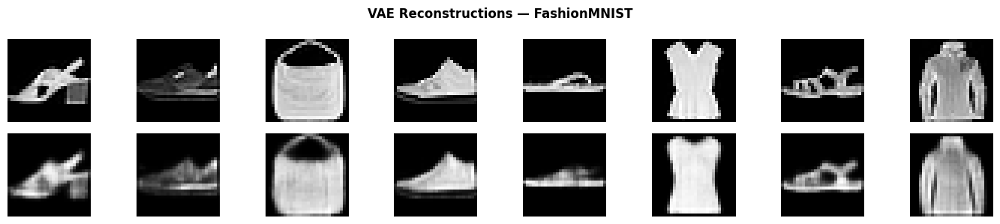

Reconstruction MSE: 0.009454


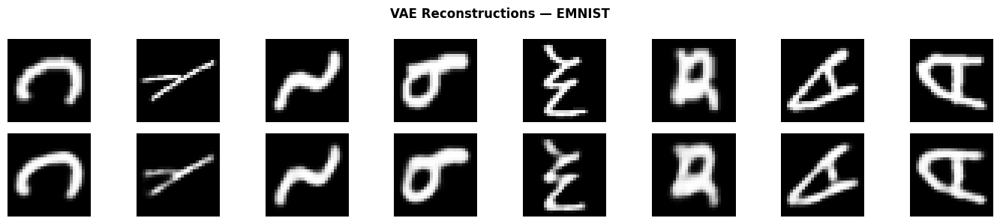

Reconstruction MSE: 0.005644


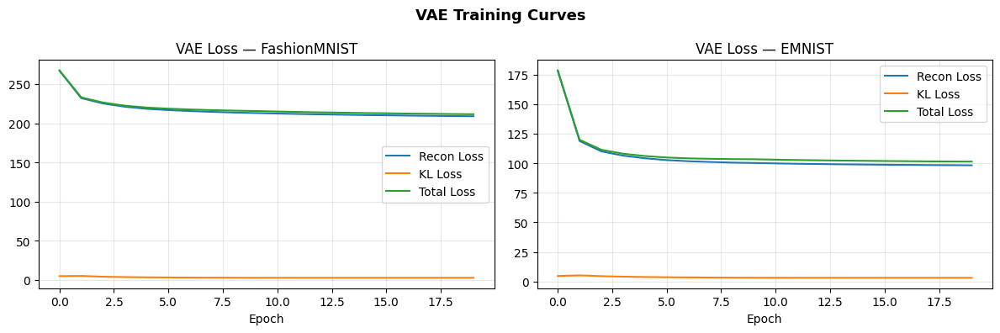

In [7]:
# ── Cell 7: Task 1 — Compare Reconstruction Quality ──────────────────────────
def show_reconstructions(model, loader, title, n=8):
    model.eval()
    imgs, _ = next(iter(loader))
    imgs = imgs[:n].to(device)
    with torch.no_grad():
        recon, _, _ = model(imgs)
    comparison = torch.cat([imgs.cpu(), recon.cpu()])
    fig, axes = plt.subplots(2, n, figsize=(14, 3))
    fig.suptitle(title, fontsize=12, fontweight='bold')
    for i in range(n):
        axes[0, i].imshow(imgs[i].squeeze().cpu(), cmap='gray'); axes[0, i].axis('off')
        axes[1, i].imshow(recon[i].squeeze().cpu().detach(), cmap='gray'); axes[1, i].axis('off')
    axes[0, 0].set_ylabel('Original', fontsize=9)
    axes[1, 0].set_ylabel('Recon',    fontsize=9)
    plt.tight_layout(); plt.show()

    # Compute MSE
    mse = F.mse_loss(recon, imgs).item()
    print(f'Reconstruction MSE: {mse:.6f}')
    return mse

mse_fmnist = show_reconstructions(vae_fmnist, fmnist_loader_vae, 'VAE Reconstructions — FashionMNIST')
mse_emnist = show_reconstructions(vae_emnist, emnist_loader_vae, 'VAE Reconstructions — EMNIST')

# Plot training curves
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, hist, ds in zip(axes, [vae_fmnist_hist, vae_emnist_hist], ['FashionMNIST', 'EMNIST']):
    ax.plot(hist['recon'], label='Recon Loss')
    ax.plot(hist['kl'],    label='KL Loss')
    ax.plot(hist['total'], label='Total Loss')
    ax.set_title(f'VAE Loss — {ds}'); ax.set_xlabel('Epoch')
    ax.legend(); ax.grid(True, alpha=0.3)
plt.suptitle('VAE Training Curves', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

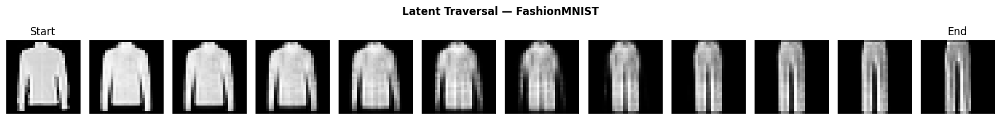

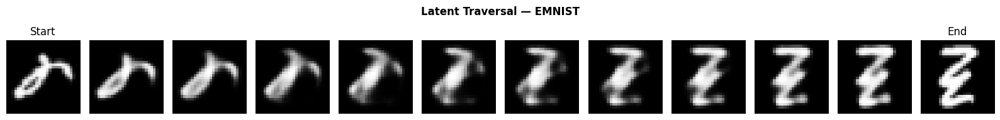

In [8]:
# ── Cell 8: Task 2 — Latent Space Traversal (Interpolation) ──────────────────
def latent_traversal(model, loader, n_steps=10, title='Latent Traversal'):
    model.eval()
    imgs, _ = next(iter(loader))
    img1, img2 = imgs[0:1].to(device), imgs[1:2].to(device)

    with torch.no_grad():
        mu1, _ = model.encoder(img1)
        mu2, _ = model.encoder(img2)

    alphas = torch.linspace(0, 1, n_steps)
    interp_imgs = []
    with torch.no_grad():
        for a in alphas:
            z    = (1 - a) * mu1 + a * mu2
            imgs_decoded = model.decoder(z)
            interp_imgs.append(imgs_decoded.cpu())

    fig, axes = plt.subplots(1, n_steps + 2, figsize=(16, 2))
    fig.suptitle(title, fontsize=12, fontweight='bold')
    axes[0].imshow(img1.squeeze().cpu(), cmap='gray'); axes[0].set_title('Start'); axes[0].axis('off')
    for i, img in enumerate(interp_imgs):
        axes[i+1].imshow(img.squeeze(), cmap='gray'); axes[i+1].axis('off')
    axes[-1].imshow(img2.squeeze().cpu(), cmap='gray'); axes[-1].set_title('End'); axes[-1].axis('off')
    plt.tight_layout(); plt.show()

latent_traversal(vae_fmnist, fmnist_loader_vae, title='Latent Traversal — FashionMNIST')
latent_traversal(vae_emnist, emnist_loader_vae, title='Latent Traversal — EMNIST')

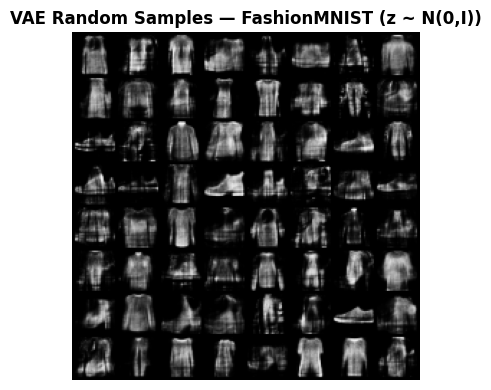

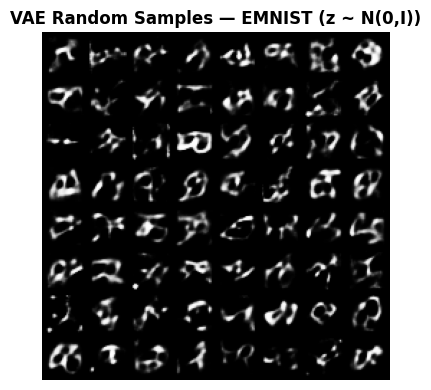

In [9]:
# ── Cell 9: Task 3 — Random Sampling from VAE ────────────────────────────────
vae_fmnist.eval()
samples = vae_fmnist.sample(64, device)
show_image_grid(samples, 'VAE Random Samples — FashionMNIST (z ~ N(0,I))')

vae_emnist.eval()
samples_em = vae_emnist.sample(64, device)
show_image_grid(samples_em, 'VAE Random Samples — EMNIST (z ~ N(0,I))')


-- Latent dim = 8 --
Epoch [ 1/15]  Total: 265.32  Recon: 264.65  KL: 6.6273  KL-w: 0.10
Epoch [ 5/15]  Total: 225.22  Recon: 223.29  KL: 3.8586  KL-w: 0.50
Epoch [10/15]  Total: 223.48  Recon: 220.33  KL: 3.1452  KL-w: 1.00
Epoch [15/15]  Total: 221.98  Recon: 218.87  KL: 3.1130  KL-w: 1.00
  Recon MSE: 0.012049  |  KL: 3.1638

-- Latent dim = 32 --
Epoch [ 1/15]  Total: 267.17  Recon: 266.74  KL: 4.3667  KL-w: 0.10
Epoch [ 5/15]  Total: 220.11  Recon: 218.50  KL: 3.2187  KL-w: 0.50
Epoch [10/15]  Total: 215.40  Recon: 212.82  KL: 2.5806  KL-w: 1.00
Epoch [15/15]  Total: 212.81  Recon: 210.25  KL: 2.5586  KL-w: 1.00
  Recon MSE: 0.008216  |  KL: 2.5574

-- Latent dim = 128 --
Epoch [ 1/15]  Total: 268.22  Recon: 268.02  KL: 1.9272  KL-w: 0.10
Epoch [ 5/15]  Total: 219.32  Recon: 218.12  KL: 2.4111  KL-w: 0.50
Epoch [10/15]  Total: 213.85  Recon: 211.98  KL: 1.8789  KL-w: 1.00
Epoch [15/15]  Total: 211.09  Recon: 209.37  KL: 1.7220  KL-w: 1.00
  Recon MSE: 0.007856  |  KL: 1.6547

  L

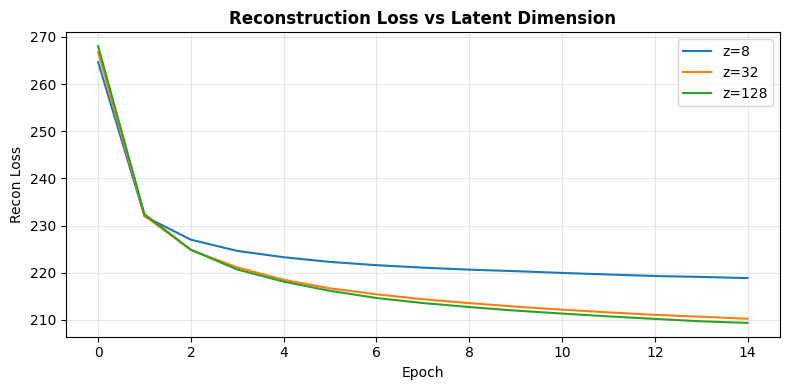

In [10]:
# ── Cell 10: Task 4 — Latent Dimension Study (z=8, 32, 128) ──────────────────
latent_dims  = [8, 32, 128]
latent_study = {}

for ld in latent_dims:
    print(f'\n-- Latent dim = {ld} --')
    model, hist = train_vae(fmnist_loader_vae, latent_dim=ld, epochs=15)
    # Compute reconstruction MSE on test batch
    model.eval()
    imgs, _ = next(iter(DataLoader(fmnist_test_vae, batch_size=256)))
    imgs = imgs.to(device)
    with torch.no_grad():
        recon, mu, logvar = model(imgs)
    mse = F.mse_loss(recon, imgs).item()
    kl  = (-0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())).item()
    latent_study[ld] = {'history': hist, 'mse': mse, 'kl': kl, 'model': model}
    print(f'  Recon MSE: {mse:.6f}  |  KL: {kl:.4f}')

# Summary
print(f"\n{'Latent Dim':>12} {'Recon MSE':>12} {'KL':>10}")
print('-' * 38)
for ld, res in latent_study.items():
    print(f"{ld:>12} {res['mse']:>12.6f} {res['kl']:>10.4f}")

# Plot final reconstruction losses
plt.figure(figsize=(8, 4))
for ld, res in latent_study.items():
    plt.plot(res['history']['recon'], label=f'z={ld}')
plt.title('Reconstruction Loss vs Latent Dimension', fontweight='bold')
plt.xlabel('Epoch'); plt.ylabel('Recon Loss'); plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

Running t-SNE...


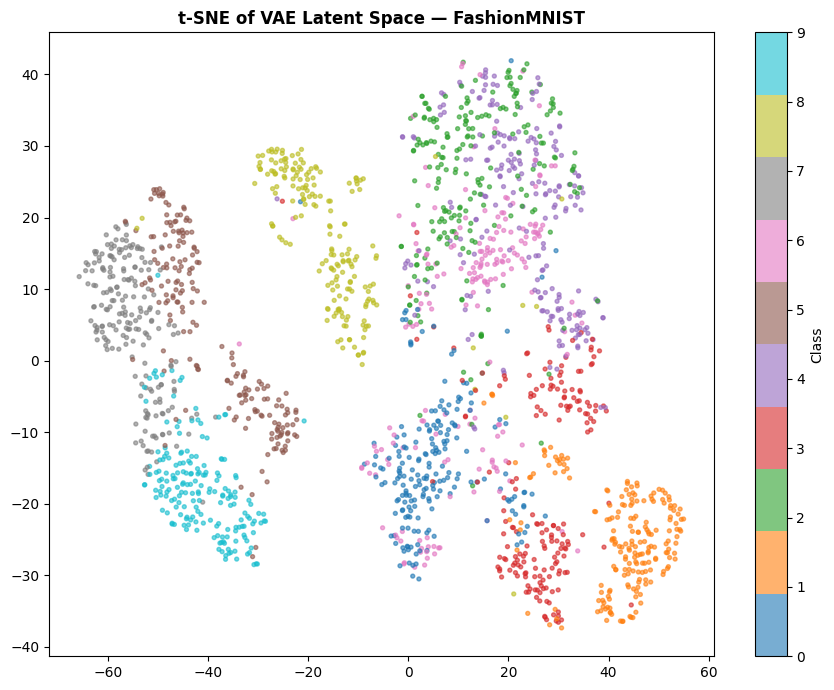

In [11]:
# ── Cell 11: Task 5 — t-SNE of Latent Space ──────────────────────────────────
vae_fmnist.eval()
latents, labels_all = [], []
with torch.no_grad():
    for imgs, lbl in DataLoader(fmnist_test_vae, batch_size=256):
        mu, _ = vae_fmnist.encoder(imgs.to(device))
        latents.append(mu.cpu().numpy())
        labels_all.extend(lbl.numpy())
        if len(labels_all) >= 2000: break

latents = np.concatenate(latents)[:2000]
labels_all = np.array(labels_all)[:2000]

print('Running t-SNE...')
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
emb  = tsne.fit_transform(latents)

plt.figure(figsize=(9, 7))
scatter = plt.scatter(emb[:, 0], emb[:, 1], c=labels_all, cmap='tab10', alpha=0.6, s=8)
plt.colorbar(scatter, label='Class')
plt.title('t-SNE of VAE Latent Space — FashionMNIST', fontweight='bold')
plt.tight_layout(); plt.show()

---
# Problem Statement 2: Vanilla GAN

Training Vanilla GAN on FashionMNIST...
Epoch [ 1/30]  G: 1.2294  D: 1.0245


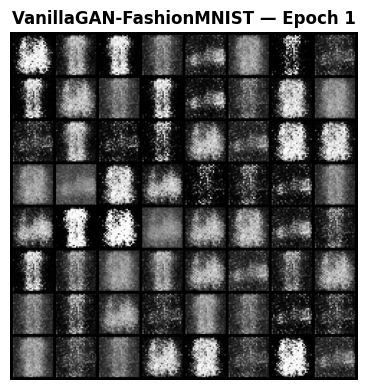

Epoch [ 5/30]  G: 1.3565  D: 1.2689


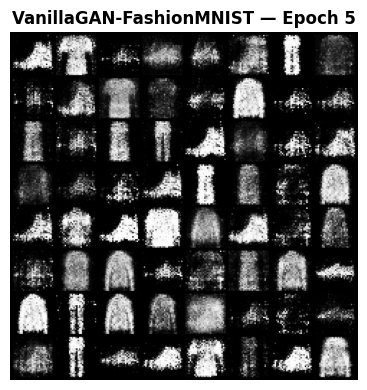

Epoch [10/30]  G: 1.2712  D: 1.1918


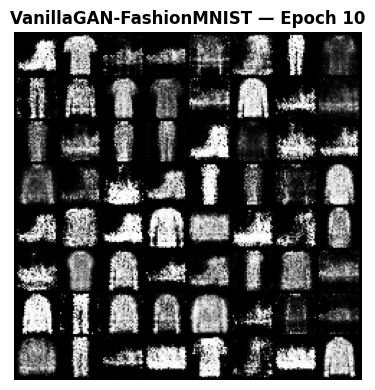

Epoch [15/30]  G: 1.0288  D: 1.3307


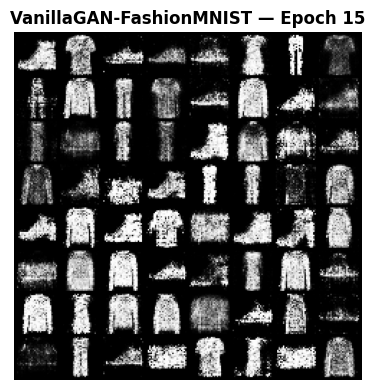

Epoch [20/30]  G: 0.9645  D: 1.3299


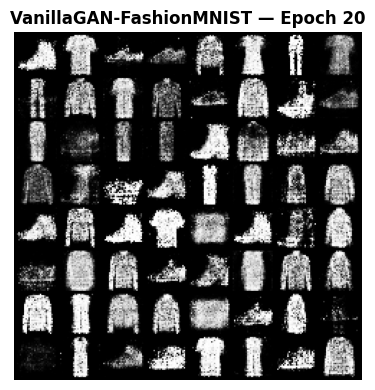

Epoch [25/30]  G: 0.9389  D: 1.3258


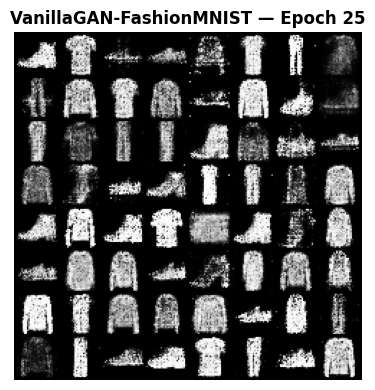

Epoch [30/30]  G: 0.9175  D: 1.3352


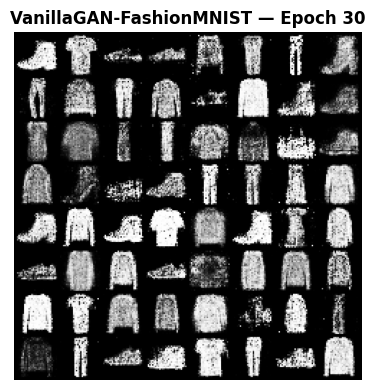

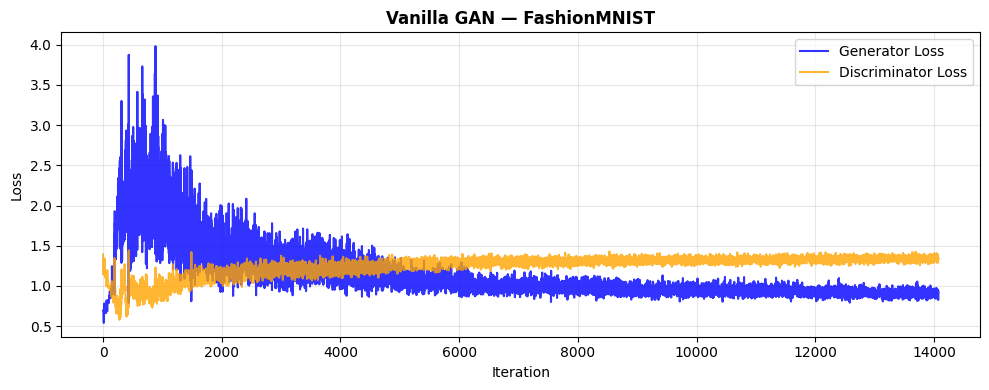

In [12]:
# ── Cell 12: Vanilla GAN Architecture ────────────────────────────────────────
NOISE_DIM = 100

class VanillaGenerator(nn.Module):
    def __init__(self, noise_dim=NOISE_DIM):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(noise_dim, 256), nn.LeakyReLU(0.2),
            nn.Linear(256, 512),       nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),      nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),      nn.Tanh()
        )
    def forward(self, z):
        return self.net(z).view(-1, 1, 28, 28)


class VanillaDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 512),  nn.LeakyReLU(0.2), nn.Dropout(0.3),
            nn.Linear(512, 256),  nn.LeakyReLU(0.2), nn.Dropout(0.3),
            nn.Linear(256, 1),    nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)


def train_vanilla_gan(loader, epochs=30, noise_dim=NOISE_DIM, label='GAN'):
    G = VanillaGenerator(noise_dim).to(device)
    D = VanillaDiscriminator().to(device)
    G.apply(weights_init); D.apply(weights_init)

    opt_G = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_D = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
    criterion = nn.BCELoss()

    G_losses, D_losses = [], []
    fixed_noise = torch.randn(64, noise_dim, device=device)

    for epoch in range(epochs):
        for i, (real_imgs, _) in enumerate(loader):
            B = real_imgs.size(0)
            real_imgs = real_imgs.to(device)

            # ── Train Discriminator ───────────────────────────────────────────
            real_labels = torch.full((B, 1), 0.9, device=device)   # label smoothing
            fake_labels = torch.zeros(B, 1, device=device)

            z         = torch.randn(B, noise_dim, device=device)
            fake_imgs = G(z).detach()

            D_real = D(real_imgs)
            D_fake = D(fake_imgs)
            loss_D  = criterion(D_real, real_labels) + criterion(D_fake, fake_labels)

            opt_D.zero_grad(); loss_D.backward(); opt_D.step()

            # ── Train Generator (non-saturating: maximise log D(G(z))) ────────
            z         = torch.randn(B, noise_dim, device=device)
            fake_imgs = G(z)
            loss_G    = criterion(D(fake_imgs), torch.ones(B, 1, device=device))

            opt_G.zero_grad(); loss_G.backward(); opt_G.step()

            G_losses.append(loss_G.item())
            D_losses.append(loss_D.item())

        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"Epoch [{epoch+1:>2}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}")
            with torch.no_grad():
                fake = G(fixed_noise)
            show_image_grid(fake, f'{label} — Epoch {epoch+1}')

    return G, D, G_losses, D_losses


# Task 6: Train on FashionMNIST
print('Training Vanilla GAN on FashionMNIST...')
G_fmnist, D_fmnist, GL_f, DL_f = train_vanilla_gan(fmnist_loader_gan, epochs=30, label='VanillaGAN-FashionMNIST')
plot_losses(GL_f, DL_f, 'Vanilla GAN — FashionMNIST')

Training Vanilla GAN on EMNIST...
Epoch [ 1/30]  G: 3.2241  D: 0.6628


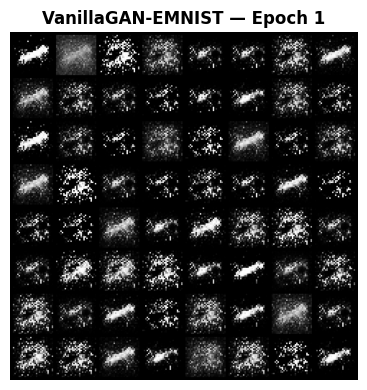

Epoch [ 5/30]  G: 1.6001  D: 0.9639


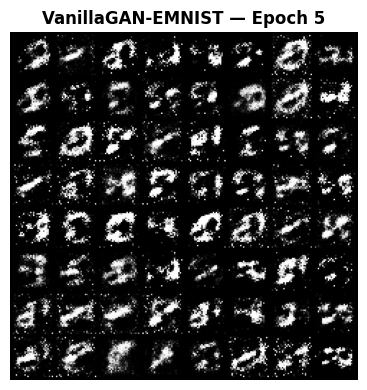

Epoch [10/30]  G: 1.5210  D: 0.9873


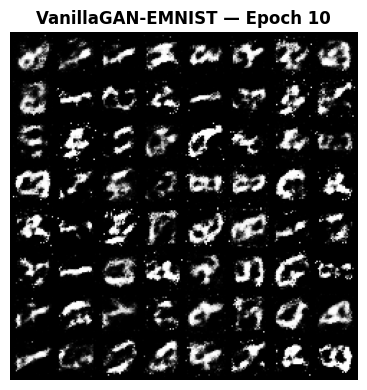

Epoch [15/30]  G: 1.4536  D: 1.0847


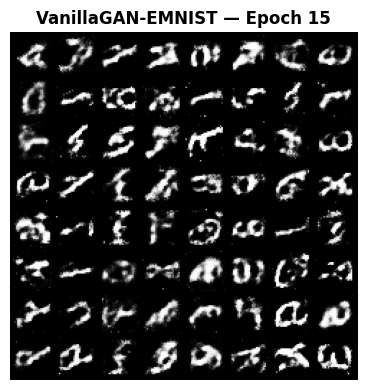

Epoch [20/30]  G: 1.4595  D: 1.2499


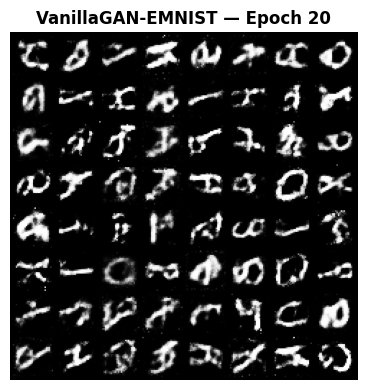

Epoch [25/30]  G: 1.1248  D: 1.1069


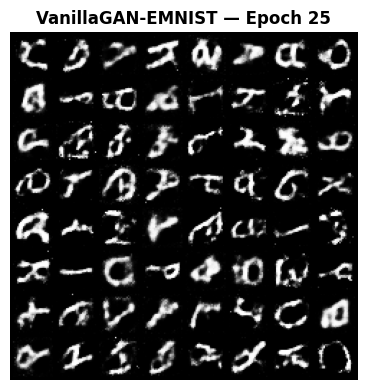

Epoch [30/30]  G: 1.6044  D: 1.1441


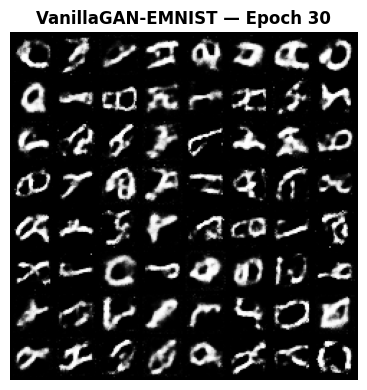

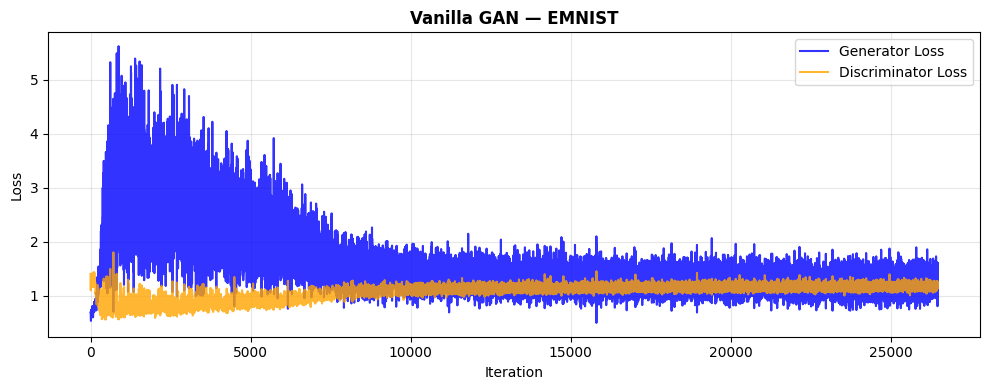

In [13]:
# Task 6 continued: Train on EMNIST
print('Training Vanilla GAN on EMNIST...')
G_emnist, D_emnist, GL_e, DL_e = train_vanilla_gan(emnist_loader_gan, epochs=30, label='VanillaGAN-EMNIST')
plot_losses(GL_e, DL_e, 'Vanilla GAN — EMNIST')

In [14]:
# ── Cell 14: Task 7 — Mode Collapse Detection ────────────────────────────────
def measure_diversity(G, noise_dim=100, n=500):
    """Pixel-space standard deviation as proxy for sample diversity."""
    G.eval()
    with torch.no_grad():
        z     = torch.randn(n, noise_dim, device=device)
        imgs  = G(z).cpu().numpy()
    std_per_pixel = imgs.std(axis=0).mean()
    return std_per_pixel

div_fmnist = measure_diversity(G_fmnist)
div_emnist = measure_diversity(G_emnist)
print(f'Pixel-space diversity (higher = more diverse, less mode collapse):')
print(f'  FashionMNIST GAN: {div_fmnist:.4f}')
print(f'  EMNIST GAN:       {div_emnist:.4f}')
print(f'  (Values near 0 indicate mode collapse)')

# Task 8: Training instability analysis (already plotted above)
# Oscillation detection
G_arr = np.array(GL_f)
D_arr = np.array(DL_f)
print(f'\nTraining Stability Analysis — FashionMNIST GAN:')
print(f'  G loss std: {G_arr.std():.4f}  (high = unstable)')
print(f'  D loss std: {D_arr.std():.4f}')
print(f'  D loss near 0 (D winning): {(D_arr < 0.01).mean()*100:.1f}% of iterations')

Pixel-space diversity (higher = more diverse, less mode collapse):
  FashionMNIST GAN: 0.5390
  EMNIST GAN:       0.4541
  (Values near 0 indicate mode collapse)

Training Stability Analysis — FashionMNIST GAN:
  G loss std: 0.3468  (high = unstable)
  D loss std: 0.1269
  D loss near 0 (D winning): 0.0% of iterations



Noise dim = 50
Epoch [ 1/15]  G: 2.3741  D: 0.8668


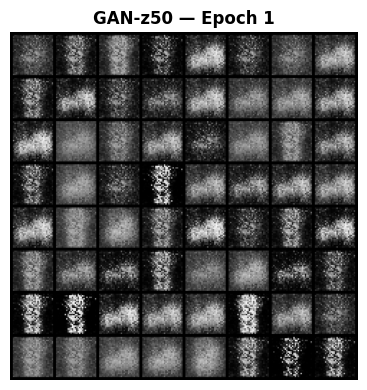

Epoch [ 5/15]  G: 1.6436  D: 1.1643


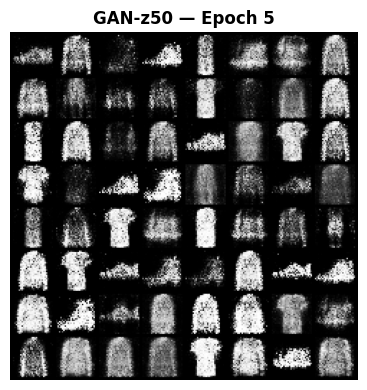

Epoch [10/15]  G: 1.1908  D: 1.1857


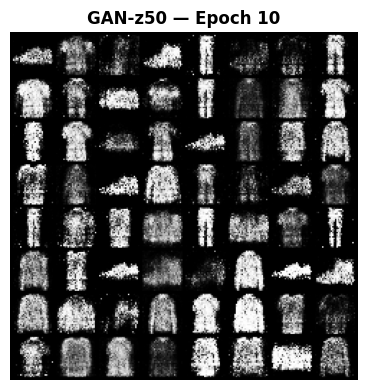

Epoch [15/15]  G: 0.9253  D: 1.3060


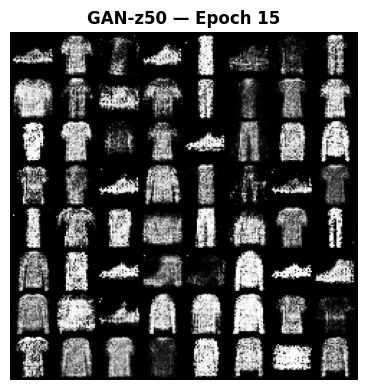

  Diversity score: 0.5358

Noise dim = 100
Epoch [ 1/15]  G: 2.4852  D: 0.7743


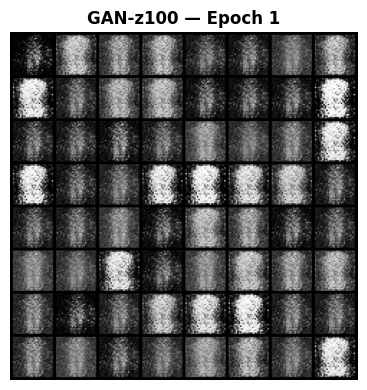

Epoch [ 5/15]  G: 1.6187  D: 0.9923


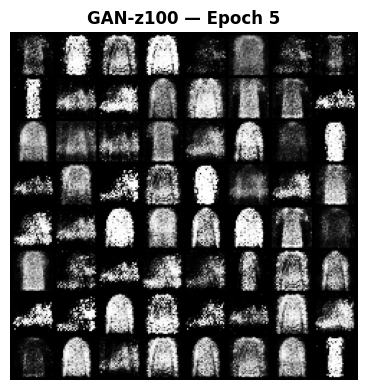

Epoch [10/15]  G: 1.1013  D: 1.3120


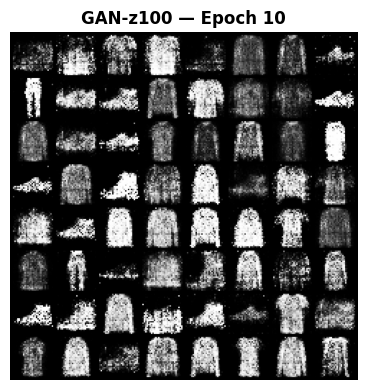

Epoch [15/15]  G: 0.9800  D: 1.2644


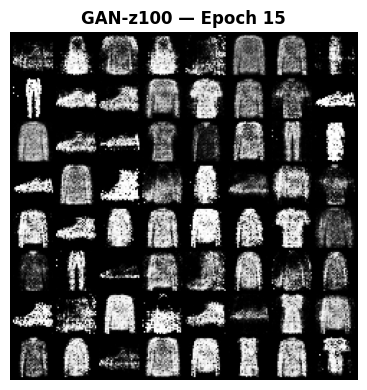

  Diversity score: 0.5418

Noise dim = 200
Epoch [ 1/15]  G: 2.1785  D: 0.7938


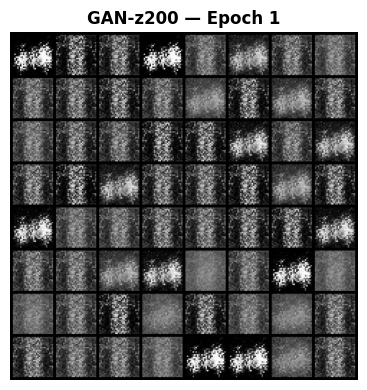

Epoch [ 5/15]  G: 1.7117  D: 1.2023


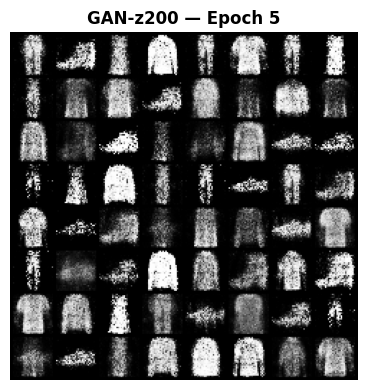

Epoch [10/15]  G: 1.0284  D: 1.3077


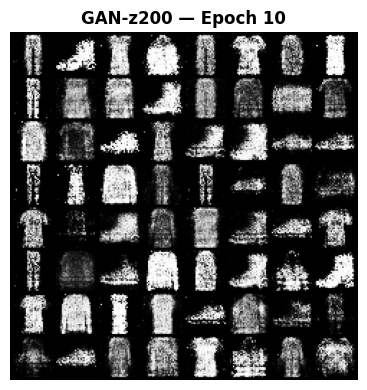

Epoch [15/15]  G: 1.0571  D: 1.2840


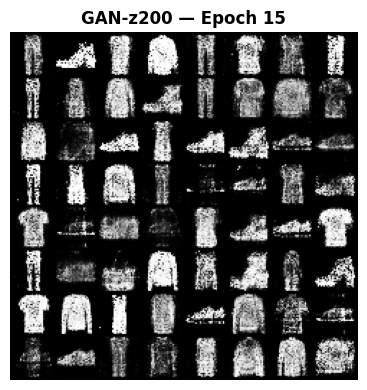

  Diversity score: 0.5399


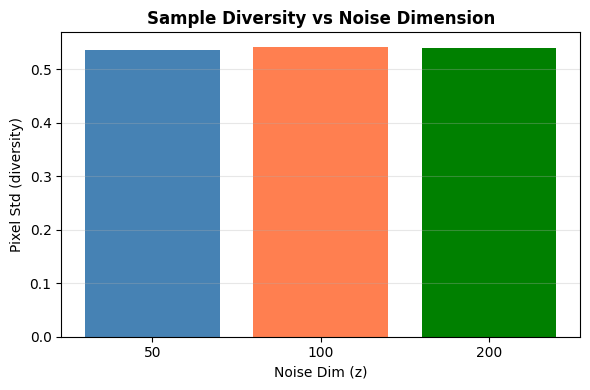

In [15]:
# ── Cell 15: Task 9 — Effect of Noise Dimension ──────────────────────────────
noise_dims   = [50, 100, 200]
noise_divs   = {}

for nd in noise_dims:
    print(f'\nNoise dim = {nd}')
    G_nd, _, GL_nd, DL_nd = train_vanilla_gan(fmnist_loader_gan, epochs=15, noise_dim=nd,
                                               label=f'GAN-z{nd}')
    noise_divs[nd] = measure_diversity(G_nd, noise_dim=nd)
    print(f'  Diversity score: {noise_divs[nd]:.4f}')

plt.figure(figsize=(6, 4))
plt.bar([str(n) for n in noise_dims], list(noise_divs.values()), color=['steelblue','coral','green'])
plt.title('Sample Diversity vs Noise Dimension', fontweight='bold')
plt.xlabel('Noise Dim (z)'); plt.ylabel('Pixel Std (diversity)')
plt.grid(axis='y', alpha=0.3); plt.tight_layout(); plt.show()

Training GAN with Gradient Penalty (lambda=10)...
Epoch [5/20]  G: 1.3060  D: 1.3438
Epoch [10/20]  G: 1.9946  D: 2.3597
Epoch [15/20]  G: 0.8127  D: 1.3766
Epoch [20/20]  G: 0.7674  D: 1.5468


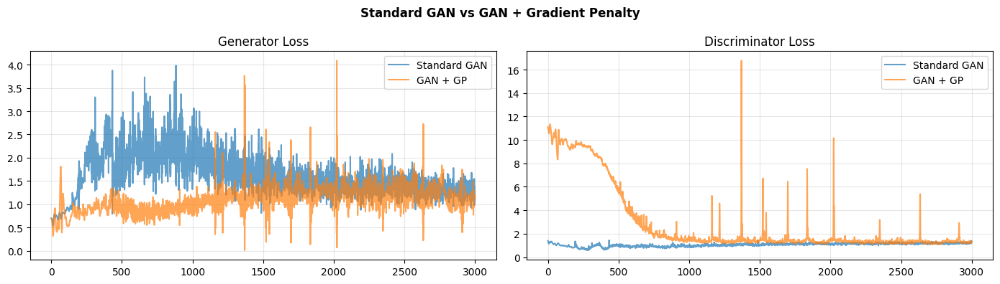

In [16]:
# ── Cell 16: Task 10 — Gradient Penalty (WGAN-GP style) ──────────────────────
def gradient_penalty(D, real, fake, device):
    B = real.size(0)
    alpha = torch.rand(B, 1, 1, 1, device=device)
    interp = (alpha * real + (1 - alpha) * fake).requires_grad_(True)
    d_interp = D(interp)
    grads = torch.autograd.grad(d_interp, interp,
                                 grad_outputs=torch.ones_like(d_interp),
                                 create_graph=True)[0]
    grads = grads.view(B, -1)
    gp    = ((grads.norm(2, dim=1) - 1) ** 2).mean()
    return gp


def train_gan_with_gp(loader, epochs=20, lambda_gp=10):
    G = VanillaGenerator().to(device)
    D = VanillaDiscriminator().to(device)
    G.apply(weights_init); D.apply(weights_init)
    opt_G = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_D = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
    criterion = nn.BCELoss()
    G_losses, D_losses = [], []

    for epoch in range(epochs):
        for real_imgs, _ in loader:
            B = real_imgs.size(0)
            real_imgs = real_imgs.to(device)
            z = torch.randn(B, NOISE_DIM, device=device)
            fake_imgs = G(z).detach()

            gp     = gradient_penalty(D, real_imgs, fake_imgs, device)
            loss_D = (criterion(D(real_imgs), torch.full((B,1),.9,device=device)) +
                      criterion(D(fake_imgs), torch.zeros(B,1,device=device)) +
                      lambda_gp * gp)
            opt_D.zero_grad(); loss_D.backward(); opt_D.step()

            z        = torch.randn(B, NOISE_DIM, device=device)
            loss_G   = criterion(D(G(z)), torch.ones(B,1,device=device))
            opt_G.zero_grad(); loss_G.backward(); opt_G.step()
            G_losses.append(loss_G.item()); D_losses.append(loss_D.item())

        if (epoch+1) % 5 == 0:
            print(f'Epoch [{epoch+1}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}')

    return G, D, G_losses, D_losses


print('Training GAN with Gradient Penalty (lambda=10)...')
G_gp, D_gp, GL_gp, DL_gp = train_gan_with_gp(fmnist_loader_gan, epochs=20)

# Compare loss stability
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(GL_f[:3000],  label='Standard GAN', alpha=0.7)
axes[0].plot(GL_gp[:3000], label='GAN + GP',     alpha=0.7)
axes[0].set_title('Generator Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)
axes[1].plot(DL_f[:3000],  label='Standard GAN', alpha=0.7)
axes[1].plot(DL_gp[:3000], label='GAN + GP',     alpha=0.7)
axes[1].set_title('Discriminator Loss'); axes[1].legend(); axes[1].grid(True, alpha=0.3)
plt.suptitle('Standard GAN vs GAN + Gradient Penalty', fontweight='bold')
plt.tight_layout(); plt.show()

---
# Problem Statement 3: Conditional GAN (CGAN)

In [17]:
# ── Cell 17: CGAN Architecture ────────────────────────────────────────────────
EMBED_DIM = 50

class CGANGenerator(nn.Module):
    def __init__(self, noise_dim=NOISE_DIM, num_classes=10, embed_dim=EMBED_DIM):
        super().__init__()
        self.label_emb = nn.Embedding(num_classes, embed_dim)
        in_dim = noise_dim + embed_dim
        self.net = nn.Sequential(
            nn.Linear(in_dim, 256), nn.BatchNorm1d(256), nn.ReLU(),
            nn.Linear(256, 512),    nn.BatchNorm1d(512), nn.ReLU(),
            nn.Linear(512, 1024),   nn.BatchNorm1d(1024), nn.ReLU(),
            nn.Linear(1024, 784),   nn.Tanh()
        )

    def forward(self, z, labels):
        emb = self.label_emb(labels)
        inp = torch.cat([z, emb], dim=1)
        return self.net(inp).view(-1, 1, 28, 28)


class CGANDiscriminator(nn.Module):
    def __init__(self, num_classes=10, embed_dim=EMBED_DIM):
        super().__init__()
        self.label_emb = nn.Embedding(num_classes, embed_dim)
        in_dim = 784 + embed_dim
        self.net = nn.Sequential(
            nn.Linear(in_dim, 512), nn.LeakyReLU(0.2), nn.Dropout(0.3),
            nn.Linear(512, 256),    nn.LeakyReLU(0.2), nn.Dropout(0.3),
            nn.Linear(256, 1),      nn.Sigmoid()
        )

    def forward(self, x, labels):
        emb = self.label_emb(labels)
        inp = torch.cat([x.view(x.size(0), -1), emb], dim=1)
        return self.net(inp)


def train_cgan(loader, num_classes=10, epochs=30, label='CGAN'):
    G = CGANGenerator(num_classes=num_classes).to(device)
    D = CGANDiscriminator(num_classes=num_classes).to(device)
    G.apply(weights_init); D.apply(weights_init)
    opt_G = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_D = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
    criterion = nn.BCELoss()
    G_losses, D_losses = [], []

    for epoch in range(epochs):
        for real_imgs, real_labels in loader:
            B = real_imgs.size(0)
            real_imgs   = real_imgs.to(device)
            real_labels = real_labels.to(device)

            # Train D
            z = torch.randn(B, NOISE_DIM, device=device)
            fake_labels = torch.randint(0, num_classes, (B,), device=device)
            fake_imgs   = G(z, fake_labels).detach()

            loss_D = (criterion(D(real_imgs, real_labels), torch.full((B,1),.9,device=device)) +
                      criterion(D(fake_imgs, fake_labels), torch.zeros(B,1,device=device)))
            opt_D.zero_grad(); loss_D.backward(); opt_D.step()

            # Train G
            z = torch.randn(B, NOISE_DIM, device=device)
            fake_labels = torch.randint(0, num_classes, (B,), device=device)
            fake_imgs   = G(z, fake_labels)
            loss_G = criterion(D(fake_imgs, fake_labels), torch.ones(B,1,device=device))
            opt_G.zero_grad(); loss_G.backward(); opt_G.step()

            G_losses.append(loss_G.item()); D_losses.append(loss_D.item())

        if (epoch+1) % 5 == 0 or epoch == 0:
            print(f'Epoch [{epoch+1:>2}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}')

    return G, D, G_losses, D_losses


print('Training CGAN on FashionMNIST...')
CG_fmnist, CD_fmnist, CGL_f, CDL_f = train_cgan(fmnist_loader_gan, num_classes=10, epochs=30)

Training CGAN on FashionMNIST...
Epoch [ 1/30]  G: 1.1176  D: 1.2900
Epoch [ 5/30]  G: 0.9445  D: 1.3712
Epoch [10/30]  G: 1.2822  D: 1.3005
Epoch [15/30]  G: 1.2996  D: 1.2095
Epoch [20/30]  G: 1.2318  D: 1.2014
Epoch [25/30]  G: 1.5890  D: 1.1573
Epoch [30/30]  G: 1.3843  D: 1.1904


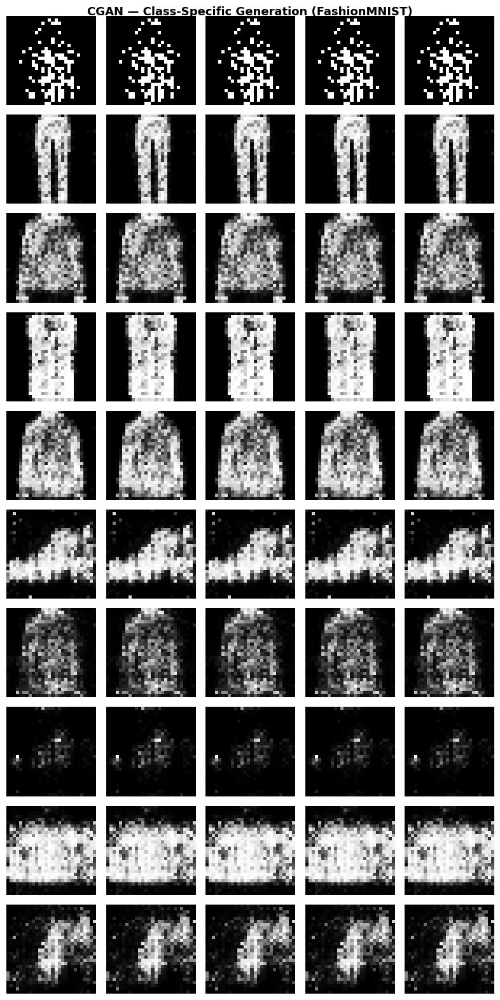

In [18]:
# ── Cell 18: Task 11 — Class-Specific Generation (5×5 grid per class) ────────
CG_fmnist.eval()
fig, axes = plt.subplots(10, 5, figsize=(8, 16))
fig.suptitle('CGAN — Class-Specific Generation (FashionMNIST)', fontsize=13, fontweight='bold')

with torch.no_grad():
    for cls in range(10):
        z      = torch.randn(5, NOISE_DIM, device=device)
        labels = torch.full((5,), cls, dtype=torch.long, device=device)
        imgs   = CG_fmnist(z, labels).cpu()
        imgs   = (imgs + 1) / 2   # [-1,1] → [0,1]
        for j in range(5):
            axes[cls, j].imshow(imgs[j].squeeze(), cmap='gray')
            axes[cls, j].axis('off')
        axes[cls, 0].set_ylabel(FMNIST_CLASSES[cls], rotation=0, labelpad=55, fontsize=8)

plt.tight_layout(); plt.show()

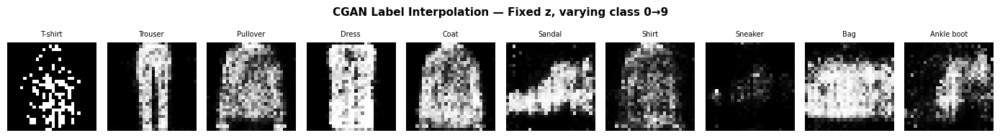

In [19]:
# ── Cell 19: Task 12 — Label Interpolation ───────────────────────────────────
CG_fmnist.eval()
z_fixed = torch.randn(1, NOISE_DIM, device=device).repeat(10, 1)

fig, axes = plt.subplots(1, 10, figsize=(14, 2))
fig.suptitle('CGAN Label Interpolation — Fixed z, varying class 0→9', fontsize=11, fontweight='bold')

with torch.no_grad():
    for cls in range(10):
        lbl  = torch.tensor([cls], device=device)
        img  = CG_fmnist(z_fixed[cls:cls+1], lbl)
        img  = (img.squeeze().cpu() + 1) / 2
        axes[cls].imshow(img, cmap='gray')
        axes[cls].set_title(FMNIST_CLASSES[cls], fontsize=7)
        axes[cls].axis('off')
plt.tight_layout(); plt.show()

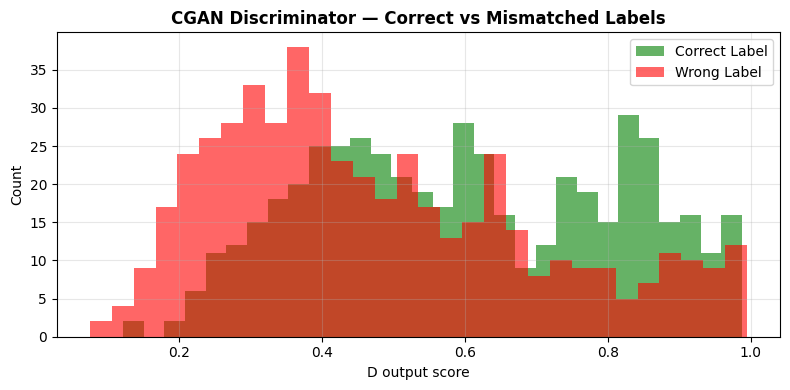

Mean D score (correct label):    0.6005
Mean D score (mismatched label): 0.4768
CGAN correctly discriminates mismatched labels: D assigns lower scores.


In [20]:
# ── Cell 20: Task 13 — Mismatched Label Attack ───────────────────────────────
CD_fmnist.eval()
n_test = 500
correct_scores, wrong_scores = [], []

with torch.no_grad():
    for real_imgs, real_labels in DataLoader(fmnist_test_gan, batch_size=128):
        real_imgs   = real_imgs.to(device)
        real_labels = real_labels.to(device)
        wrong_labels = (real_labels + torch.randint(1, 10, real_labels.shape, device=device)) % 10

        score_correct = CD_fmnist(real_imgs, real_labels).squeeze().cpu().tolist()
        score_wrong   = CD_fmnist(real_imgs, wrong_labels).squeeze().cpu().tolist()
        correct_scores.extend(score_correct)
        wrong_scores.extend(score_wrong)
        if len(correct_scores) >= n_test: break

correct_scores = np.array(correct_scores[:n_test])
wrong_scores   = np.array(wrong_scores[:n_test])

plt.figure(figsize=(8, 4))
plt.hist(correct_scores, bins=30, alpha=0.6, label='Correct Label', color='green')
plt.hist(wrong_scores,   bins=30, alpha=0.6, label='Wrong Label',   color='red')
plt.title('CGAN Discriminator — Correct vs Mismatched Labels', fontweight='bold')
plt.xlabel('D output score'); plt.ylabel('Count')
plt.legend(); plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()
print(f'Mean D score (correct label):    {correct_scores.mean():.4f}')
print(f'Mean D score (mismatched label): {wrong_scores.mean():.4f}')
print(f'CGAN correctly discriminates mismatched labels: D assigns lower scores.')

Intra-class pixel-space variance per class (CGAN FashionMNIST):
Class               Variance
------------------------------
T-shirt             0.000001
Trouser             0.000255
Pullover            0.000447
Dress               0.002764
Coat                0.000331
Sandal              0.000193
Shirt               0.000312
Sneaker             0.000097
Bag                 0.000327
Ankle boot          0.000483


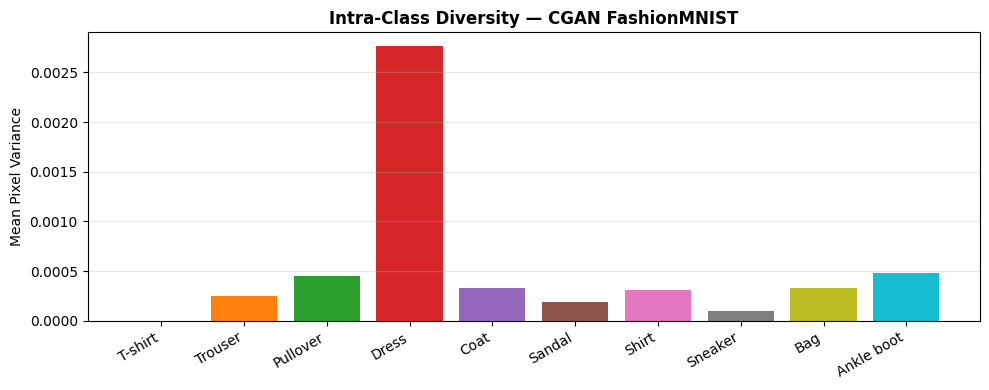

In [21]:
# ── Cell 21: Task 15 — Intra-Class Diversity ─────────────────────────────────
CG_fmnist.eval()
print('Intra-class pixel-space variance per class (CGAN FashionMNIST):')
print(f'{"Class":<15} {"Variance":>12}')
print('-' * 30)

intra_vars = []
with torch.no_grad():
    for cls in range(10):
        z   = torch.randn(100, NOISE_DIM, device=device)
        lbl = torch.full((100,), cls, dtype=torch.long, device=device)
        samples = CG_fmnist(z, lbl).cpu().numpy()
        var = samples.var(axis=0).mean()
        intra_vars.append(var)
        print(f'{FMNIST_CLASSES[cls]:<15} {var:>12.6f}')

plt.figure(figsize=(10, 4))
plt.bar(FMNIST_CLASSES, intra_vars, color=plt.cm.tab10(np.linspace(0,1,10)))
plt.title('Intra-Class Diversity — CGAN FashionMNIST', fontweight='bold')
plt.ylabel('Mean Pixel Variance'); plt.xticks(rotation=30, ha='right')
plt.grid(axis='y', alpha=0.3); plt.tight_layout(); plt.show()

---
# Problem Statement 4: DCGAN

Training baseline DCGAN on FashionMNIST...
Epoch [ 1/30]  G: 2.4837  D: 0.4610


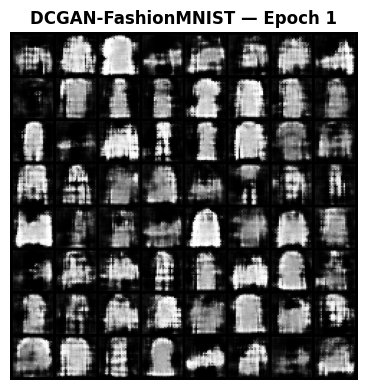

Epoch [ 5/30]  G: 1.3721  D: 0.6067


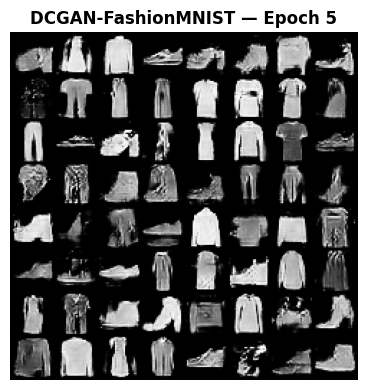

Epoch [10/30]  G: 1.4984  D: 0.7265


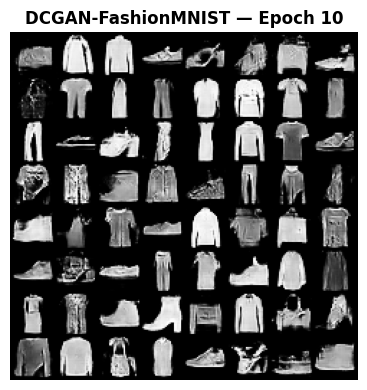

Epoch [15/30]  G: 2.0025  D: 0.6828


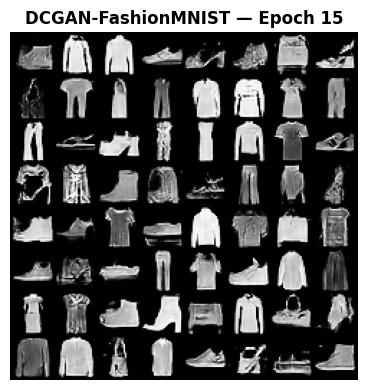

Epoch [20/30]  G: 3.5859  D: 0.4206


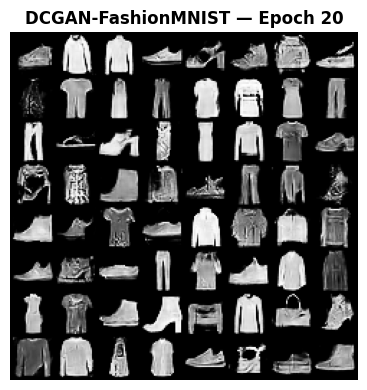

Epoch [25/30]  G: 3.8974  D: 0.7832


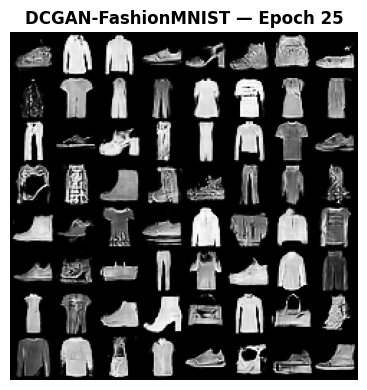

Epoch [30/30]  G: 3.8146  D: 0.4020


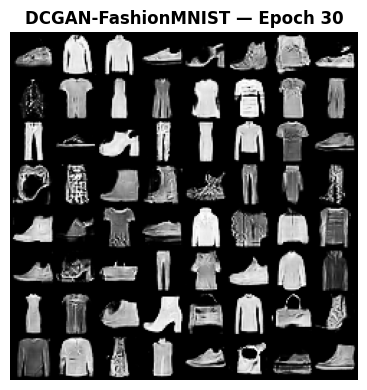

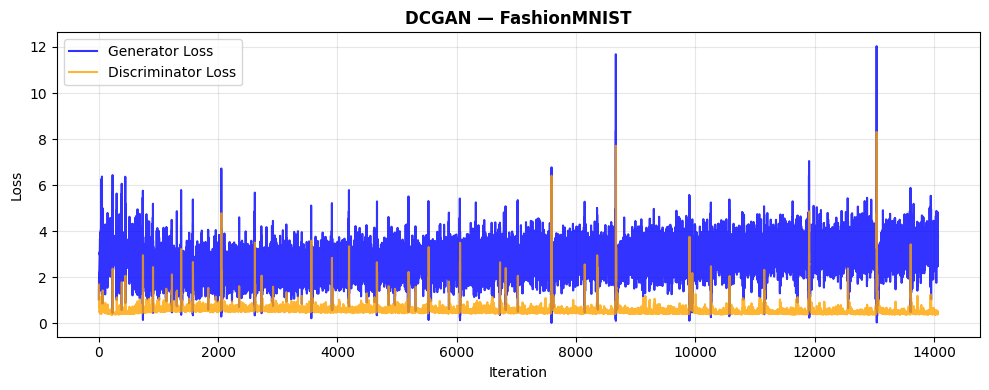

In [22]:
# ── Cell 22: DCGAN Architecture (Radford et al. 2015) ────────────────────────
class DCGANGenerator(nn.Module):
    """
    z (100) → project to 7×7×128 → ConvTranspose × 2 → 28×28×1
    """
    def __init__(self, noise_dim=NOISE_DIM, ngf=128):
        super().__init__()
        self.project = nn.Sequential(
            nn.Linear(noise_dim, ngf * 7 * 7), nn.ReLU()
        )
        self.conv_blocks = nn.Sequential(
            # 7×7 → 14×14
            nn.ConvTranspose2d(ngf,      ngf // 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf // 2), nn.ReLU(True),
            # 14×14 → 28×28
            nn.ConvTranspose2d(ngf // 2, 1,        4, 2, 1, bias=False),
            nn.Tanh()
        )
        self.ngf = ngf

    def forward(self, z):
        x = self.project(z).view(-1, self.ngf, 7, 7)
        return self.conv_blocks(x)


class DCGANDiscriminator(nn.Module):
    """
    28×28×1 → Strided Conv × 3 → Flatten → FC(1)
    """
    def __init__(self, ndf=64):
        super().__init__()
        self.net = nn.Sequential(
            # 28×28 → 14×14  (no BN on first layer)
            nn.Conv2d(1, ndf, 4, 2, 1, bias=False), nn.LeakyReLU(0.2, inplace=True),
            # 14×14 → 7×7
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False), nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2, True),
            # 7×7 → 3×3
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False), nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2, True),
            nn.Flatten(),
            nn.Linear(ndf * 4 * 3 * 3, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)


def train_dcgan(loader, epochs=30, use_specnorm=False, remove_batchnorm_G=False,
                remove_batchnorm_D=False, label='DCGAN'):
    G = DCGANGenerator().to(device)
    D = DCGANDiscriminator().to(device)

    if remove_batchnorm_G:
        for m in G.modules():
            if isinstance(m, nn.BatchNorm2d): m.eval()
    if remove_batchnorm_D:
        for m in D.modules():
            if isinstance(m, nn.BatchNorm2d): m.eval()
    if use_specnorm:
        for name, m in D.named_modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                parent = D
                parts  = name.split('.')
                for p in parts[:-1]: parent = getattr(parent, p)
                setattr(parent, parts[-1], nn.utils.spectral_norm(m))

    G.apply(weights_init); D.apply(weights_init)
    opt_G = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_D = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
    criterion = nn.BCELoss()
    G_losses, D_losses = [], []
    fixed_noise = torch.randn(64, NOISE_DIM, device=device)

    for epoch in range(epochs):
        for real_imgs, _ in loader:
            B = real_imgs.size(0)
            real_imgs = real_imgs.to(device)
            z = torch.randn(B, NOISE_DIM, device=device)
            fake_imgs = G(z).detach()
            loss_D = (criterion(D(real_imgs),  torch.full((B,1),.9,device=device)) +
                      criterion(D(fake_imgs),  torch.zeros(B,1,device=device)))
            opt_D.zero_grad(); loss_D.backward(); opt_D.step()

            z = torch.randn(B, NOISE_DIM, device=device)
            loss_G = criterion(D(G(z)), torch.ones(B,1,device=device))
            opt_G.zero_grad(); loss_G.backward(); opt_G.step()

            G_losses.append(loss_G.item()); D_losses.append(loss_D.item())

        if (epoch+1) % 5 == 0 or epoch == 0:
            print(f'Epoch [{epoch+1:>2}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}')
            with torch.no_grad():
                fake = G(fixed_noise)
            show_image_grid(fake, f'{label} — Epoch {epoch+1}')

    return G, D, G_losses, D_losses


# Task 16: Baseline DCGAN
print('Training baseline DCGAN on FashionMNIST...')
DCG_fmnist, DCD_fmnist, DCGL_f, DCDL_f = train_dcgan(fmnist_loader_gan, epochs=30, label='DCGAN-FashionMNIST')
plot_losses(DCGL_f, DCDL_f, 'DCGAN — FashionMNIST')

Training DCGAN on EMNIST...
Epoch [ 1/30]  G: 3.9906  D: 0.4057


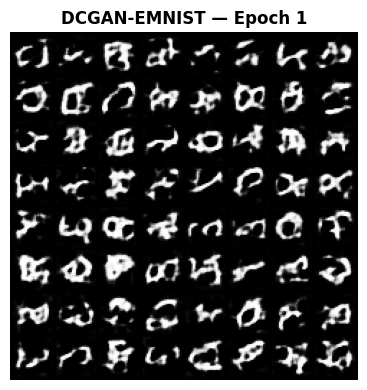

Epoch [ 5/30]  G: 3.4275  D: 0.6114


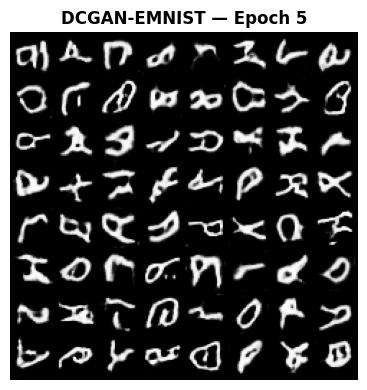

Epoch [10/30]  G: 4.6960  D: 0.3689


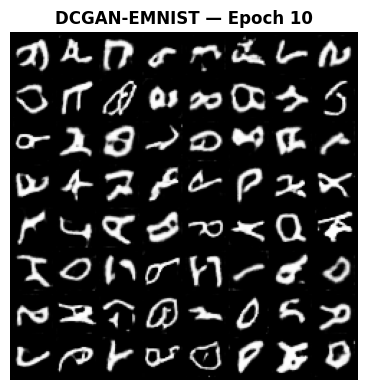

Epoch [15/30]  G: 4.0629  D: 0.3583


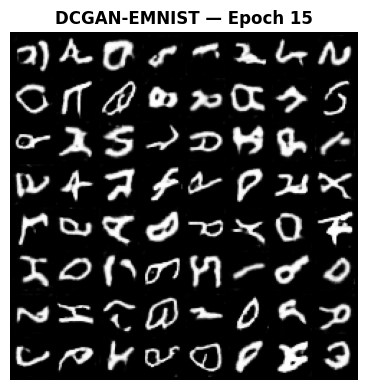

Epoch [20/30]  G: 6.7816  D: 0.3949


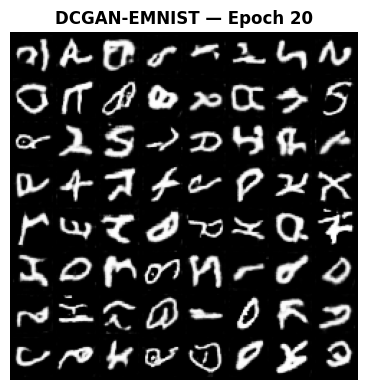

Epoch [25/30]  G: 2.1581  D: 0.4575


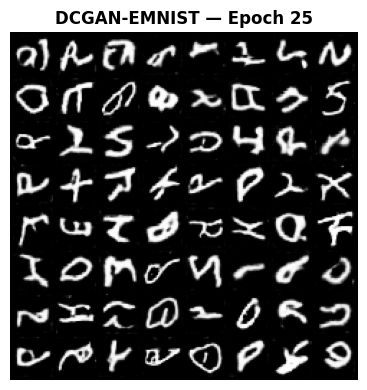

Epoch [30/30]  G: 5.5948  D: 0.3444


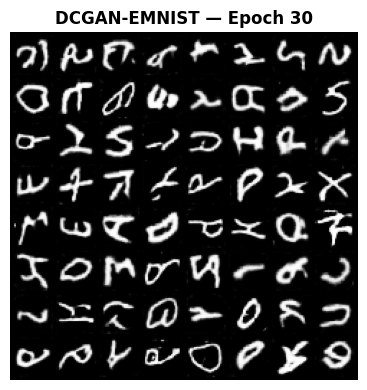

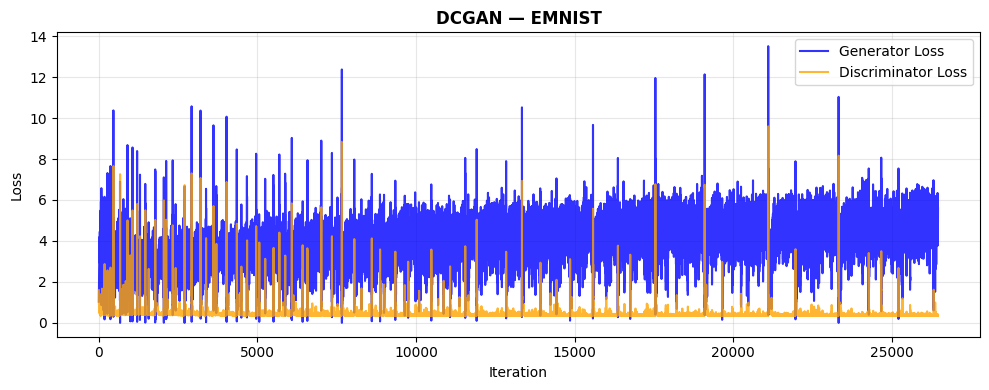

In [23]:
# Task 16 continued: DCGAN on EMNIST
print('Training DCGAN on EMNIST...')
DCG_emnist, DCD_emnist, DCGL_e, DCDL_e = train_dcgan(emnist_loader_gan, epochs=30, label='DCGAN-EMNIST')
plot_losses(DCGL_e, DCDL_e, 'DCGAN — EMNIST')


Ablation: DCGAN-Full-BN
Epoch [ 1/15]  G: 2.8522  D: 0.4503


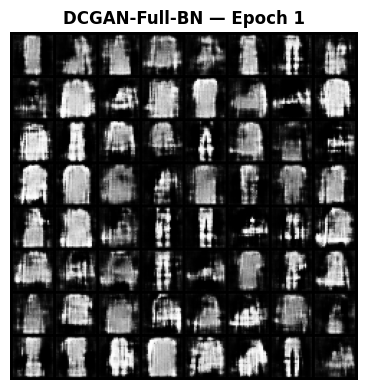

Epoch [ 5/15]  G: 1.9079  D: 0.7001


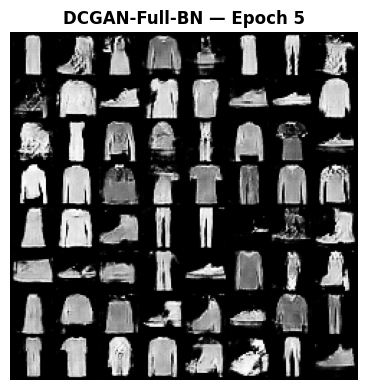

Epoch [10/15]  G: 2.0005  D: 0.7724


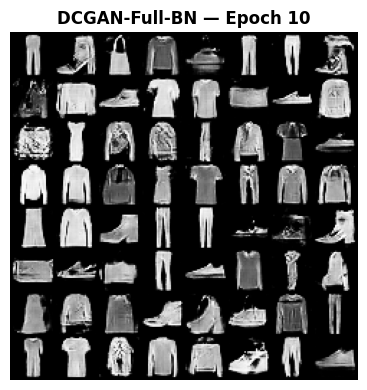

Epoch [15/15]  G: 2.3760  D: 0.5296


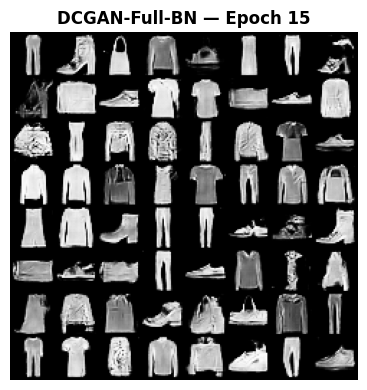


Ablation: DCGAN-No-BN-G
Epoch [ 1/15]  G: 5.7261  D: 0.5222


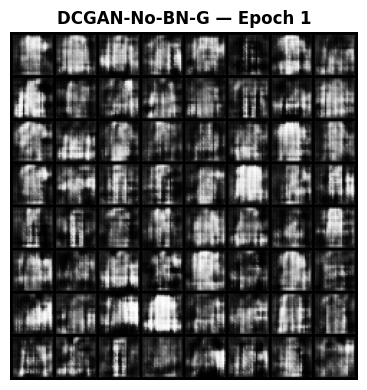

Epoch [ 5/15]  G: 3.5397  D: 0.4204


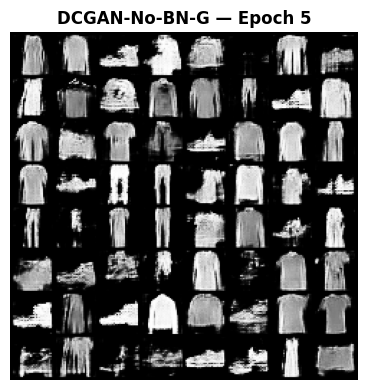

Epoch [10/15]  G: 3.4284  D: 0.5334


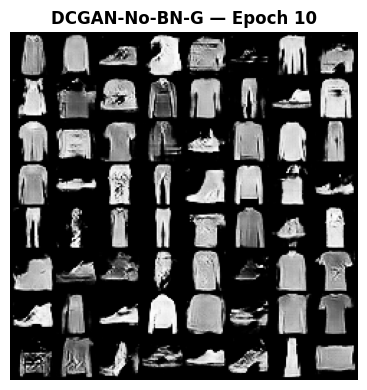

Epoch [15/15]  G: 2.9824  D: 0.5780


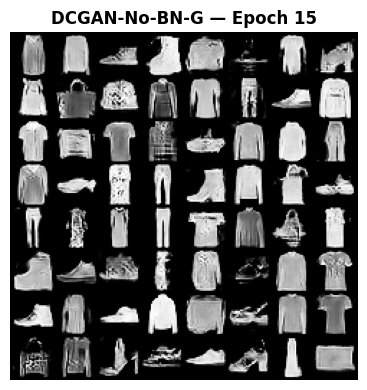


Ablation: DCGAN-No-BN-D
Epoch [ 1/15]  G: 1.7804  D: 0.8637


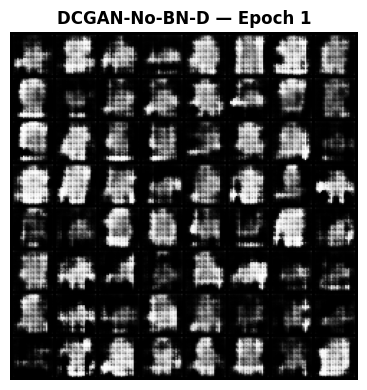

Epoch [ 5/15]  G: 1.5001  D: 1.1345


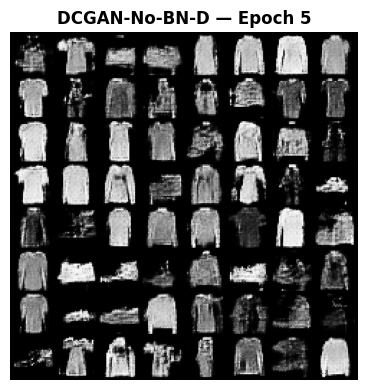

Epoch [10/15]  G: 1.1874  D: 1.1541


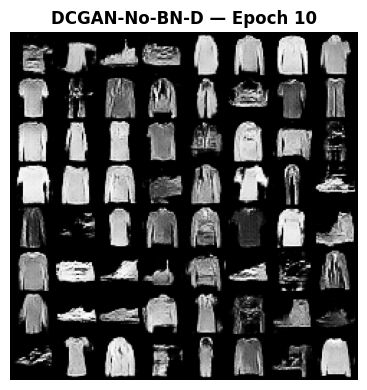

Epoch [15/15]  G: 1.1407  D: 1.1416


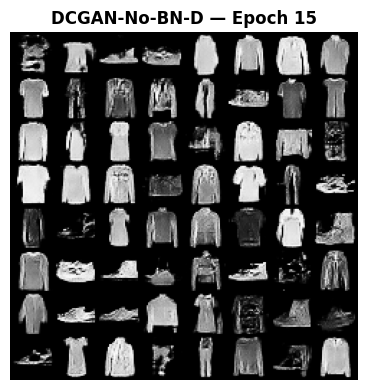


Ablation: DCGAN-No-BN-Both
Epoch [ 1/15]  G: 2.6993  D: 0.5863


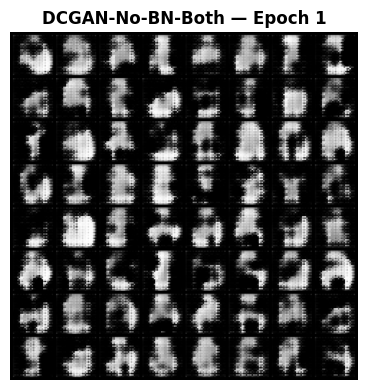

Epoch [ 5/15]  G: 3.2359  D: 0.6220


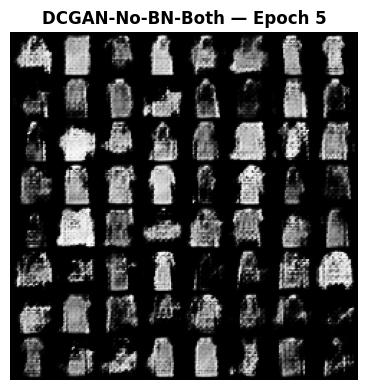

Epoch [10/15]  G: 1.6501  D: 0.8781


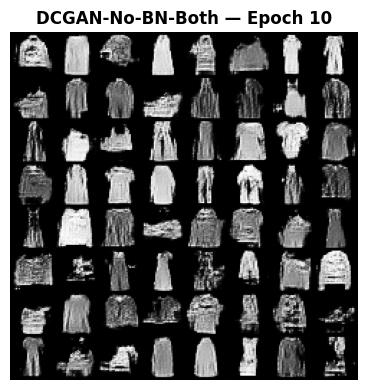

Epoch [15/15]  G: 1.7320  D: 0.8591


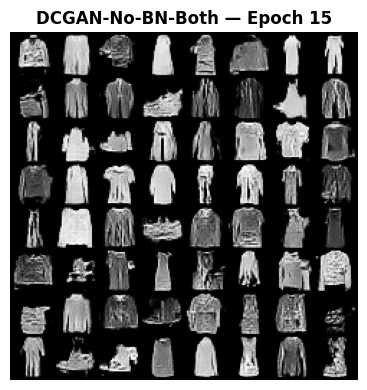

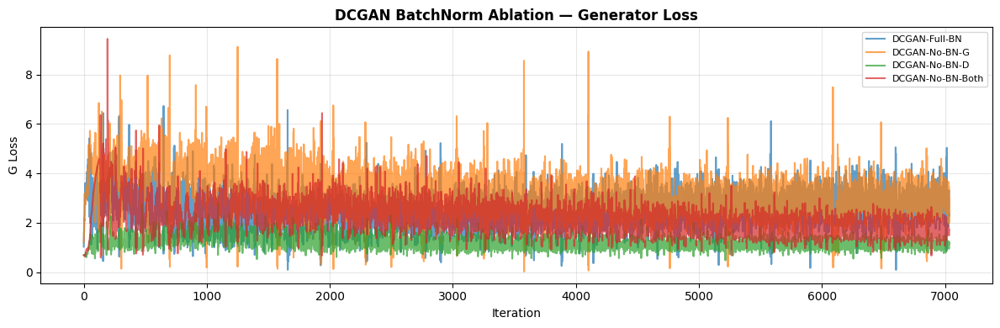

In [24]:
# ── Cell 24: Task 17 — BatchNorm Ablation ────────────────────────────────────
ablation_configs = [
    {'label': 'DCGAN-Full-BN',   'remove_batchnorm_G': False, 'remove_batchnorm_D': False},
    {'label': 'DCGAN-No-BN-G',   'remove_batchnorm_G': True,  'remove_batchnorm_D': False},
    {'label': 'DCGAN-No-BN-D',   'remove_batchnorm_G': False, 'remove_batchnorm_D': True},
    {'label': 'DCGAN-No-BN-Both','remove_batchnorm_G': True,  'remove_batchnorm_D': True},
]

ablation_results = {}
for cfg in ablation_configs:
    print(f"\nAblation: {cfg['label']}")
    G_abl, D_abl, GL_abl, DL_abl = train_dcgan(
        fmnist_loader_gan, epochs=15,
        remove_batchnorm_G=cfg['remove_batchnorm_G'],
        remove_batchnorm_D=cfg['remove_batchnorm_D'],
        label=cfg['label'])
    ablation_results[cfg['label']] = {'G_losses': GL_abl, 'D_losses': DL_abl}

# Compare loss curves
plt.figure(figsize=(12, 4))
for lbl, res in ablation_results.items():
    plt.plot(res['G_losses'], label=lbl, alpha=0.7)
plt.title('DCGAN BatchNorm Ablation — Generator Loss', fontweight='bold')
plt.xlabel('Iteration'); plt.ylabel('G Loss')
plt.legend(fontsize=8); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

Training DCGAN with Spectral Normalisation...
Epoch [ 1/20]  G: 2.2454  D: 0.4533


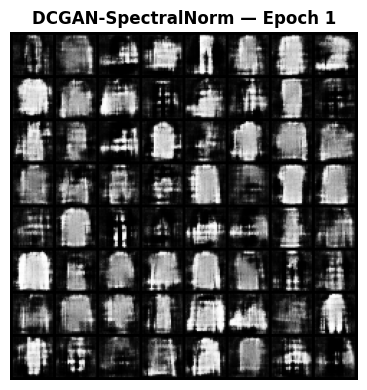

Epoch [ 5/20]  G: 1.4755  D: 0.7505


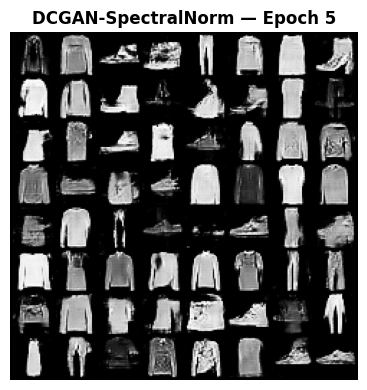

Epoch [10/20]  G: 2.4223  D: 0.6566


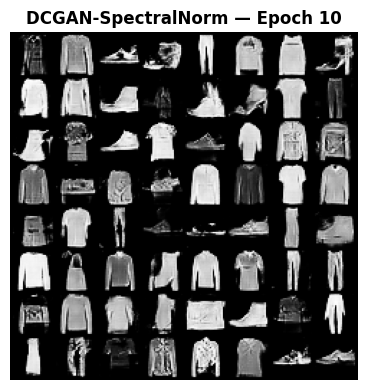

Epoch [15/20]  G: 1.3126  D: 0.8152


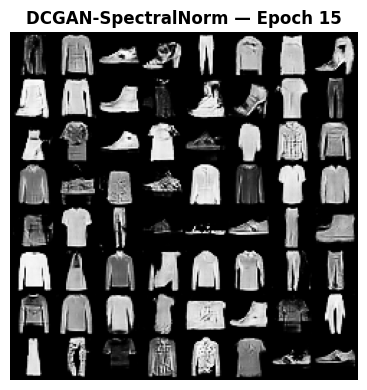

Epoch [20/20]  G: 1.6830  D: 0.5792


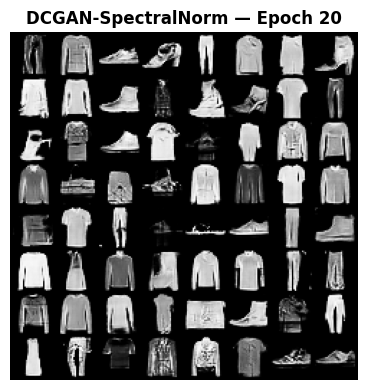


Diversity — Baseline DCGAN:          0.5342
Diversity — DCGAN + SpectralNorm:    0.5352


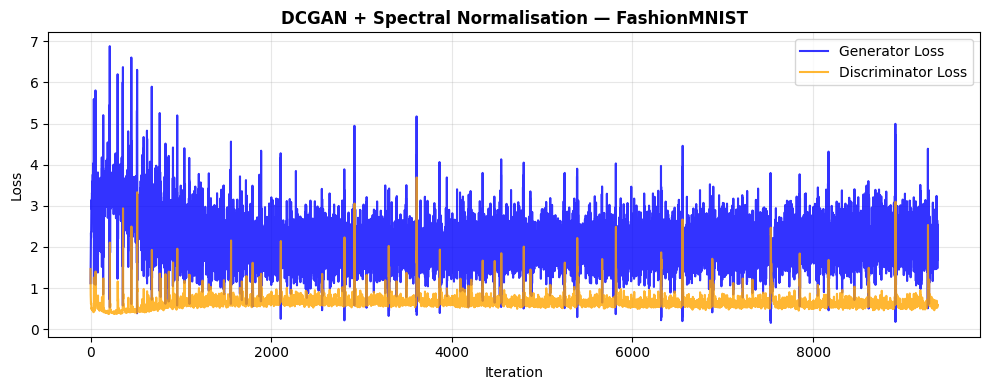

In [25]:
# ── Cell 25: Task 18 — Spectral Normalisation ─────────────────────────────────
print('Training DCGAN with Spectral Normalisation...')
DCG_sn, DCD_sn, GL_sn, DL_sn = train_dcgan(fmnist_loader_gan, epochs=20,
                                              use_specnorm=True, label='DCGAN-SpectralNorm')

# Compare final-epoch diversity
div_base = measure_diversity(DCG_fmnist)
div_sn   = measure_diversity(DCG_sn)
print(f'\nDiversity — Baseline DCGAN:          {div_base:.4f}')
print(f'Diversity — DCGAN + SpectralNorm:    {div_sn:.4f}')

plot_losses(GL_sn, DL_sn, 'DCGAN + Spectral Normalisation — FashionMNIST')

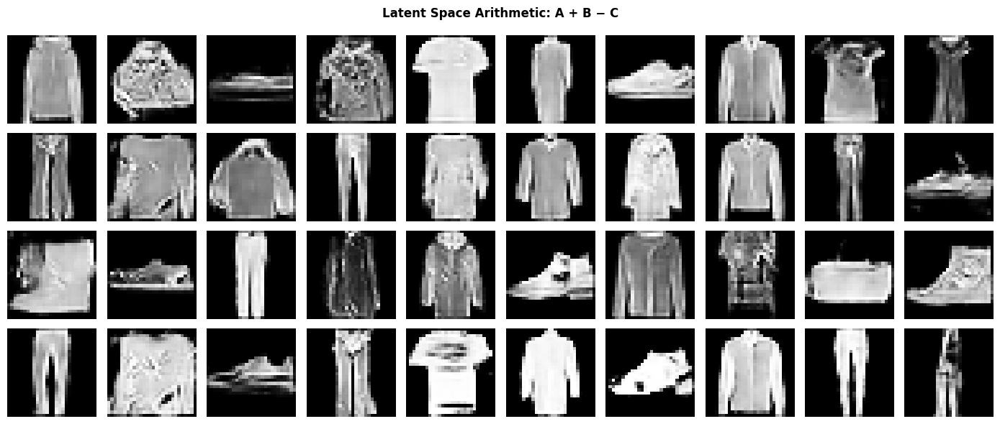

In [26]:
# ── Cell 26: Task 20 — Latent Space Arithmetic ───────────────────────────────
# Generate images from arithmetic of latent vectors
DCG_fmnist.eval()

def semantic_arithmetic(G, n_samples=10):
    """
    z_result = z_A + z_B - z_C
    Shows that semantic directions exist in latent space.
    """
    z_A = torch.randn(n_samples, NOISE_DIM, device=device)
    z_B = torch.randn(n_samples, NOISE_DIM, device=device)
    z_C = torch.randn(n_samples, NOISE_DIM, device=device)
    z_result = z_A + z_B - z_C

    with torch.no_grad():
        imgs_A      = G(z_A).cpu()
        imgs_B      = G(z_B).cpu()
        imgs_C      = G(z_C).cpu()
        imgs_result = G(z_result).cpu()

    fig, axes = plt.subplots(4, n_samples, figsize=(14, 6))
    fig.suptitle('Latent Space Arithmetic: A + B − C', fontsize=12, fontweight='bold')
    row_labels = ['A', 'B', 'C', 'A+B−C']
    for row_idx, imgs in enumerate([imgs_A, imgs_B, imgs_C, imgs_result]):
        for col in range(n_samples):
            img = (imgs[col].squeeze() + 1) / 2
            axes[row_idx, col].imshow(img, cmap='gray')
            axes[row_idx, col].axis('off')
        axes[row_idx, 0].set_ylabel(row_labels[row_idx], rotation=0, labelpad=25, fontsize=10)
    plt.tight_layout(); plt.show()

semantic_arithmetic(DCG_fmnist)

---
# Problem Statement 5: Comparative Study

In [34]:
# ── Cell 27: Comprehensive Comparison ────────────────────────────────────────
def compute_reconstruction_mse(model, loader, model_type='vae'):
    model.eval()
    total_mse = 0; n = 0
    with torch.no_grad():
        for imgs, _ in loader:
            imgs = imgs.to(device)
            recon, _, _ = model(imgs)
            total_mse += F.mse_loss(recon, imgs).item()
            n += 1
            if n >= 10: break
    return total_mse / n


comparison_data = {
    'Model':         ['VAE',     'GAN',       'CGAN',      'DCGAN'],
    'Dataset':       ['FashionMNIST'] * 4,
    'Params (M)':    [
        count_parameters(vae_fmnist) / 1e6,
        count_parameters(G_fmnist) / 1e6,
        count_parameters(CG_fmnist) / 1e6,
        count_parameters(DCG_fmnist) / 1e6
    ],
    'Recon MSE':     [mse_fmnist, 'N/A', 'N/A', 'N/A'],
    'Sample Diversity': [
        measure_diversity(vae_fmnist) if hasattr(vae_fmnist, 'sample') else '-',
        measure_diversity(G_fmnist),
        measure_diversity(CG_fmnist),
        measure_diversity(DCG_fmnist)
    ]
}

print(f"{'Model':<8} {'Dataset':<15} {'Params(M)':>10} {'Recon MSE':>12} {'Diversity':>12}")
print('─' * 62)
for i in range(4):
    mse_val = f"{comparison_data['Recon MSE'][i]:.5f}" if isinstance(comparison_data['Recon MSE'][i], float) else 'N/A'
    div_val = f"{comparison_data['Sample Diversity'][i]:.4f}" if isinstance(comparison_data['Sample Diversity'][i], float) else '-'
    print(f"{comparison_data['Model'][i]:<8} "
          f"{comparison_data['Dataset'][i]:<15} "
          f"{comparison_data['Params (M)'][i]:>10.3f} "
          f"{mse_val:>12} "
          f"{div_val:>12}")

RuntimeError: mat1 and mat2 shapes cannot be multiplied (500x100 and 784x512)

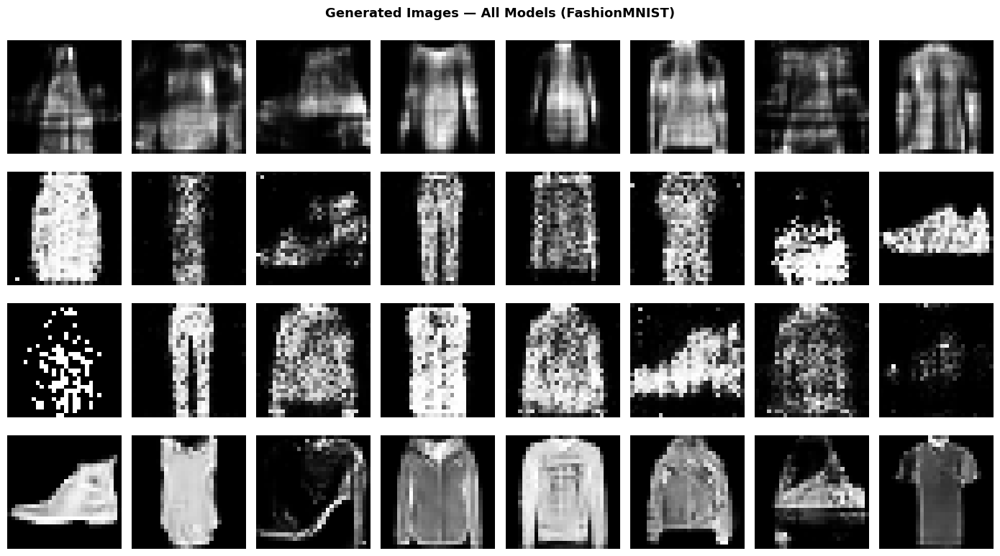

In [28]:
# ── Cell 28: Side-by-Side Generated Image Comparison ─────────────────────────
fig, axes = plt.subplots(4, 8, figsize=(14, 8))
fig.suptitle('Generated Images — All Models (FashionMNIST)', fontsize=13, fontweight='bold')
row_labels = ['VAE', 'GAN', 'CGAN', 'DCGAN']

# VAE samples
vae_fmnist.eval()
with torch.no_grad():
    vae_samples = vae_fmnist.sample(8, device).cpu()

# GAN samples
G_fmnist.eval()
with torch.no_grad():
    gan_samples = G_fmnist(torch.randn(8, NOISE_DIM, device=device)).cpu()

# CGAN samples (class 0-7)
CG_fmnist.eval()
with torch.no_grad():
    z   = torch.randn(8, NOISE_DIM, device=device)
    lbl = torch.arange(8, device=device)
    cgan_samples = CG_fmnist(z, lbl).cpu()

# DCGAN samples
DCG_fmnist.eval()
with torch.no_grad():
    dcgan_samples = DCG_fmnist(torch.randn(8, NOISE_DIM, device=device)).cpu()

all_samples = [vae_samples, gan_samples, cgan_samples, dcgan_samples]
for row_idx, (samples, lbl) in enumerate(zip(all_samples, row_labels)):
    for col in range(8):
        img = samples[col].squeeze()
        if img.min() < 0: img = (img + 1) / 2
        axes[row_idx, col].imshow(img, cmap='gray')
        axes[row_idx, col].axis('off')
    axes[row_idx, 0].set_ylabel(lbl, rotation=0, labelpad=40, fontsize=10, fontweight='bold')

plt.tight_layout(); plt.show()

---
# Problem Statement 6: Data Augmentation with Generative Models

In [30]:
# ── Cell 29: Simple CNN Classifier ───────────────────────────────────────────
class SimpleCNN(nn.Module):
    """LeNet-5 style classifier for FashionMNIST."""
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 256), nn.ReLU(), nn.Dropout(0.4),
            nn.Linear(256, num_classes)
        )
    def forward(self, x):
        return self.classifier(self.features(x))


def train_classifier(train_loader, test_loader, epochs=10, label='Classifier'):
    model = SimpleCNN().to(device)
    opt   = optim.Adam(model.parameters(), lr=0.001)
    crit  = nn.CrossEntropyLoss()
    best_acc = 0

    for epoch in range(epochs):
        model.train()
        for imgs, lbls in train_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            loss = crit(model(imgs), lbls)
            opt.zero_grad(); loss.backward(); opt.step()

        # Evaluate
        model.eval()
        correct = total = 0
        with torch.no_grad():
            for imgs, lbls in test_loader:
                imgs = imgs.to(device)
                preds = model(imgs).argmax(1).cpu()
                correct += (preds == lbls).sum().item()
                total   += lbls.size(0)
        acc = correct / total
        best_acc = max(best_acc, acc)
        if (epoch+1) % 3 == 0:
            print(f'  [{label}] Epoch {epoch+1:>2}/{epochs}  Acc: {acc:.4f}')

    return model, best_acc


# Task 21: Baseline — 10% real data
n_real   = int(0.1 * len(fmnist_train_gan))
subset   = Subset(fmnist_train_vae, list(range(n_real)))
sub_loader = DataLoader(subset, batch_size=64, shuffle=True)
test_loader_vae = DataLoader(fmnist_test_vae, batch_size=128)

print('Training classifier on 10% real data (baseline)...')
clf_baseline, acc_baseline = train_classifier(sub_loader, test_loader_vae, epochs=10, label='Baseline')
print(f'Baseline accuracy (10% real): {acc_baseline:.4f}')

Training classifier on 10% real data (baseline)...
  [Baseline] Epoch  3/10  Acc: 0.8258
  [Baseline] Epoch  6/10  Acc: 0.8568
  [Baseline] Epoch  9/10  Acc: 0.8693
Baseline accuracy (10% real): 0.8701


In [ ]:
# ── Cell 30: Task 22-24 — Augment with CGAN synthetic data ───────────────────
from torch.utils.data import TensorDataset, ConcatDataset

# Generate synthetic data from CGAN
print('Generating synthetic images from CGAN...')
CG_fmnist.eval()
synth_imgs, synth_lbls = [], []

per_class = n_real // 10   # equal synthetic samples per class
with torch.no_grad():
    for cls in range(10):
        z   = torch.randn(per_class, NOISE_DIM, device=device)
        lbl = torch.full((per_class,), cls, dtype=torch.long, device=device)
        imgs = CG_fmnist(z, lbl).cpu()
        imgs = (imgs + 1) / 2   # [-1,1] → [0,1]
        imgs = imgs.clamp(0, 1)
        synth_imgs.append(imgs)
        synth_lbls.extend([cls] * per_class)

synth_imgs  = torch.cat(synth_imgs)
synth_lbls  = torch.tensor(synth_lbls)
synth_ds    = TensorDataset(synth_imgs, synth_lbls)
augmented_ds = ConcatDataset([subset, synth_ds])
aug_loader   = DataLoader(augmented_ds, batch_size=64, shuffle=True)

print(f'Real samples: {len(subset)}  |  Synthetic: {len(synth_ds)}  |  Total: {len(augmented_ds)}')
print('\nTraining classifier on real + synthetic data...')
clf_augmented, acc_augmented = train_classifier(aug_loader, test_loader_vae, epochs=10, label='Augmented')
print(f'\nAugmented accuracy (real + CGAN synthetic): {acc_augmented:.4f}')

# Summary
improvement = (acc_augmented - acc_baseline) * 100
print(f'\nImprovement from synthetic augmentation: {improvement:+.2f}%')

# Bar chart
plt.figure(figsize=(6, 4))
bars = plt.bar(['Baseline\n(10% real)', 'Augmented\n(real + CGAN)'],
               [acc_baseline, acc_augmented], color=['steelblue', 'coral'], width=0.4)
for bar, acc in zip(bars, [acc_baseline, acc_augmented]):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
             f'{acc:.4f}', ha='center', fontsize=11)
plt.ylim(0, 1)
plt.title('Classifier Accuracy: Baseline vs Augmented', fontweight='bold')
plt.ylabel('Test Accuracy'); plt.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()

---
# Problem Statement 7: GAN Variants — Loss Function & Training Stability

In [37]:
# ── Cell 31: GAN Variant Implementations ─────────────────────────────────────

# ── WGAN (Weight Clipping) ────────────────────────────────────────────────────
def train_wgan(loader, epochs=20, clip_value=0.01, label='WGAN'):
    G = VanillaGenerator().to(device)
    D = VanillaDiscriminator().to(device)   # no sigmoid needed but reuse arch
    # Replace final sigmoid with linear for critic
    D.net[-1] = nn.Identity()
    G.apply(weights_init); D.apply(weights_init)
    opt_G = optim.RMSprop(G.parameters(), lr=5e-5)
    opt_D = optim.RMSprop(D.parameters(), lr=5e-5)
    G_losses, D_losses = [], []

    for epoch in range(epochs):
        for i, (real_imgs, _) in enumerate(loader):
            B = real_imgs.size(0)
            real_imgs = real_imgs.to(device)

            # Train Critic (D) 5 times per G step
            for _ in range(5):
                z = torch.randn(B, NOISE_DIM, device=device)
                loss_D = -D(real_imgs).mean() + D(G(z).detach()).mean()
                opt_D.zero_grad(); loss_D.backward(); opt_D.step()
                for p in D.parameters(): p.data.clamp_(-clip_value, clip_value)

            z = torch.randn(B, NOISE_DIM, device=device)
            loss_G = -D(G(z)).mean()
            opt_G.zero_grad(); loss_G.backward(); opt_G.step()

            G_losses.append(loss_G.item()); D_losses.append(loss_D.item())

        if (epoch+1) % 5 == 0:
            print(f'[{label}] Epoch [{epoch+1}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}')

    return G, G_losses, D_losses


# ── WGAN-GP ───────────────────────────────────────────────────────────────────
def train_wgan_gp(loader, epochs=20, lambda_gp=10, label='WGAN-GP'):
    G = VanillaGenerator().to(device)
    D = VanillaDiscriminator().to(device)
    D.net[-1] = nn.Identity()
    G.apply(weights_init); D.apply(weights_init)
    opt_G = optim.Adam(G.parameters(), lr=1e-4, betas=(0.0, 0.9))
    opt_D = optim.Adam(D.parameters(), lr=1e-4, betas=(0.0, 0.9))
    G_losses, D_losses = [], []

    for epoch in range(epochs):
        for real_imgs, _ in loader:
            B = real_imgs.size(0)
            real_imgs = real_imgs.to(device)
            z = torch.randn(B, NOISE_DIM, device=device)
            fake_imgs = G(z).detach()

            gp     = gradient_penalty(D, real_imgs, fake_imgs, device)
            loss_D = -D(real_imgs).mean() + D(fake_imgs).mean() + lambda_gp * gp
            opt_D.zero_grad(); loss_D.backward(); opt_D.step()

            z = torch.randn(B, NOISE_DIM, device=device)
            loss_G = -D(G(z)).mean()
            opt_G.zero_grad(); loss_G.backward(); opt_G.step()

            G_losses.append(loss_G.item()); D_losses.append(loss_D.item())

        if (epoch+1) % 5 == 0:
            print(f'[{label}] Epoch [{epoch+1}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}')

    return G, G_losses, D_losses


# ── LSGAN ────────────────────────────────────────────────────────────────────
def train_lsgan(loader, epochs=20, label='LSGAN'):
    G = VanillaGenerator().to(device)
    D = VanillaDiscriminator().to(device)
    D.net[-1] = nn.Identity()   # no sigmoid — LS loss does not need it
    G.apply(weights_init); D.apply(weights_init)
    opt_G = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_D = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
    G_losses, D_losses = [], []

    for epoch in range(epochs):
        for real_imgs, _ in loader:
            B = real_imgs.size(0)
            real_imgs = real_imgs.to(device)
            z = torch.randn(B, NOISE_DIM, device=device)
            fake_imgs = G(z).detach()

            # Least-squares loss: D targets (real=1, fake=0)
            loss_D = (0.5 * ((D(real_imgs) - 1)**2).mean() +
                      0.5 * ( D(fake_imgs)**2).mean())
            opt_D.zero_grad(); loss_D.backward(); opt_D.step()

            z = torch.randn(B, NOISE_DIM, device=device)
            loss_G = 0.5 * ((D(G(z)) - 1)**2).mean()
            opt_G.zero_grad(); loss_G.backward(); opt_G.step()

            G_losses.append(loss_G.item()); D_losses.append(loss_D.item())

        if (epoch+1) % 5 == 0:
            print(f'[{label}] Epoch [{epoch+1}/{epochs}]  G: {loss_G.item():.4f}  D: {loss_D.item():.4f}')

    return G, G_losses, D_losses


print('Training GAN Variants on FashionMNIST...')

Training GAN Variants on FashionMNIST...


== Vanilla GAN ==
Epoch [ 1/20]  G: 2.3144  D: 0.9796


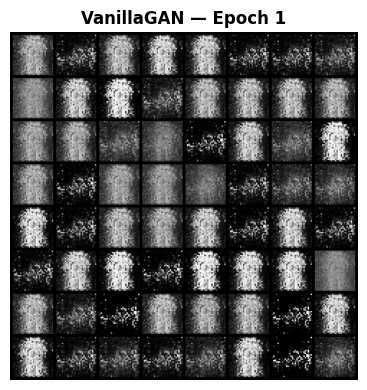

Epoch [ 5/20]  G: 1.4139  D: 1.1555


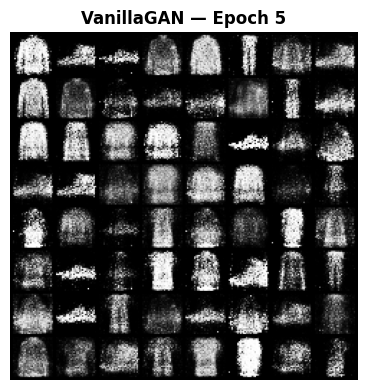

In [ ]:
# ── Cell 32: Run All GAN Variants ─────────────────────────────────────────────
EPOCHS_VAR = 20

print('== Vanilla GAN ==')
G_van, _, GL_van, DL_van = train_vanilla_gan(fmnist_loader_gan, epochs=EPOCHS_VAR, label='VanillaGAN')

print('\n== WGAN ==')
G_wgan, GL_wgan, DL_wgan = train_wgan(fmnist_loader_gan, epochs=EPOCHS_VAR)

print('\n== WGAN-GP ==')
G_wgan_gp, GL_wgangp, DL_wgangp = train_wgan_gp(fmnist_loader_gan, epochs=EPOCHS_VAR)

print('\n== LSGAN ==')
G_lsgan, GL_lsgan, DL_lsgan = train_lsgan(fmnist_loader_gan, epochs=EPOCHS_VAR)

NameError: name 'GL_van' is not defined

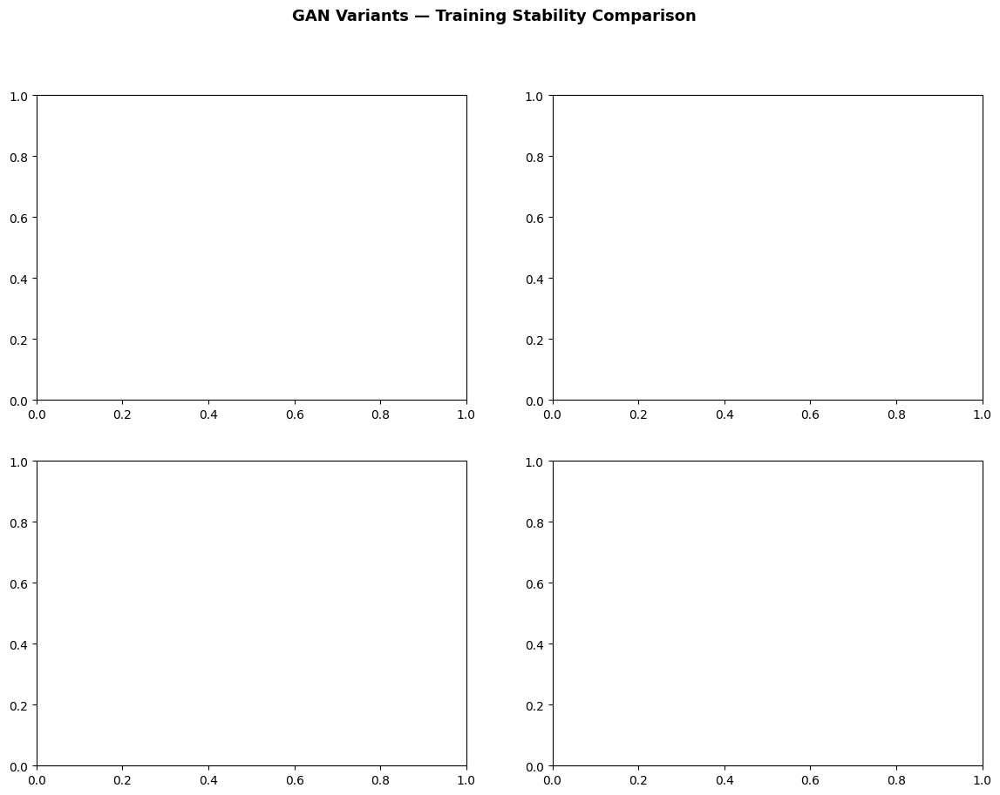

In [32]:
# ── Cell 33: Compare All GAN Variants ────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('GAN Variants — Training Stability Comparison', fontsize=13, fontweight='bold')

variants = [
    ('Vanilla GAN', GL_van,    DL_van),
    ('WGAN',        GL_wgan,   DL_wgan),
    ('WGAN-GP',     GL_wgangp, DL_wgangp),
    ('LSGAN',       GL_lsgan,  DL_lsgan),
]

for ax, (name, gl, dl) in zip(axes.flat, variants):
    # Smooth with rolling mean
    gl_smooth = np.convolve(gl, np.ones(50)/50, mode='valid')
    dl_smooth = np.convolve(dl, np.ones(50)/50, mode='valid')
    ax.plot(gl_smooth, label='G Loss', color='blue',   alpha=0.8)
    ax.plot(dl_smooth, label='D Loss', color='orange', alpha=0.8)
    ax.set_title(name, fontweight='bold'); ax.set_xlabel('Iteration')
    ax.legend(); ax.grid(True, alpha=0.3)

plt.tight_layout(); plt.show()

# Sample quality comparison
fig, axes = plt.subplots(4, 8, figsize=(14, 8))
fig.suptitle('GAN Variants — Generated Samples (FashionMNIST)', fontsize=13, fontweight='bold')

variant_generators = [('Vanilla GAN', G_van), ('WGAN', G_wgan), ('WGAN-GP', G_wgan_gp), ('LSGAN', G_lsgan)]
for row_idx, (name, G_var) in enumerate(variant_generators):
    G_var.eval()
    with torch.no_grad():
        imgs = G_var(torch.randn(8, NOISE_DIM, device=device)).cpu()
    for col in range(8):
        img = imgs[col].squeeze()
        if img.min() < 0: img = (img + 1) / 2
        axes[row_idx, col].imshow(img, cmap='gray'); axes[row_idx, col].axis('off')
    axes[row_idx, 0].set_ylabel(name, rotation=0, labelpad=55, fontsize=9, fontweight='bold')

plt.tight_layout(); plt.show()

# Diversity comparison
print('\nSample Diversity (higher = more diverse):')
for name, G_var in variant_generators:
    div = measure_diversity(G_var)
    print(f'  {name:<15}: {div:.4f}')

In [ ]:
# ── Cell 34: Final Summary Report ─────────────────────────────────────────────
print('=' * 65)
print('         FINAL SUMMARY — Lab Practical 6')
print('=' * 65)
print("""
Model        | Latent Space    | Class Control | Sample Quality | Stability
─────────────┼─────────────────┼───────────────┼────────────────┼──────────
VAE          | Structured μ,σ  | Partial (CVAE)| Blurry         | High
Vanilla GAN  | Unstructured z  | None          | Sharp          | Low
CGAN         | Conditioned z   | Full          | Sharp+Ctrl     | Medium
DCGAN        | Unstructured z  | None          | Sharpest       | Medium+
WGAN         | Unstructured z  | None          | Good           | High
WGAN-GP      | Unstructured z  | None          | Best           | Highest
LSGAN        | Unstructured z  | None          | Good           | High

Recommendations:
  • For data augmentation:      CGAN or DCGAN (controllable + sharp)
  • For stable training:        WGAN-GP
  • For interpretable latents:  VAE
  • For class-specific gen:     CGAN
  • For best visual quality:    DCGAN
""")
print('\n✅ Lab Practical 6 — Complete! All 7 problem statements implemented.')